<a href="https://colab.research.google.com/github/tianrengao/Tibetan_Book_Cropping2/blob/master/new_BONPO_ABHISEKA_TEXTS_left.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# import packages and set directory



In [0]:
# acqure the authorization of the google drive, so that we could read from it and save cropped images to it
import os
from google.colab import drive
drive.mount('/content/gdrive')
os.chdir("/content/gdrive/My Drive/Kurt's/Tibetan-Cropping/BONPO ABHISEKA TEXTS/left side") #Change the path to the directory that contains all code and data

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
# Create a diretory to save cropped images
!mkdir  ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side
# Create list.txt that contains the list of images to be cropped
!touch list.txt
!ls *.jpg > list.txt

mkdir: cannot create directory ‘../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side’: File exists


In [0]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from scipy.cluster.vq import whiten
import cv2 as cv

## Input your image information

In [0]:
# output path
path = "../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side"
image_list = [] # all the images to be cropped
failed_list = [] # if any cropping fails, add it to failed_list for later cropping
# add all the cropping images to the image_list
with open("list.txt","r") as f:
  for image_name in f:
    name = image_name[:-1]
    image_list.append(name)

image_list = sorted(image_list)
print(image_list)


# hyperparameters
threshold = 2
rows = 10
tol = 125 # the cropped image should has height larger than tol, 
          # otherwise, we decline this cropping and move on to the next cropping
mean_height = 300


  # img = cv.imread(image_name)
  # # dst = cv.fastNlMeansDenoisingColored(img,None,10,10,7,21)
  # im = Image.fromarray(img)
  # print(im.size)

['image00001.jpg', 'image00002.jpg', 'image00003.jpg', 'image00004.jpg', 'image00005.jpg', 'image00006.jpg', 'image00007.jpg', 'image00008.jpg', 'image00009.jpg', 'image00010.jpg', 'image00011.jpg', 'image00012.jpg', 'image00013.jpg', 'image00014.jpg', 'image00015.jpg', 'image00016.jpg', 'image00017.jpg', 'image00018.jpg', 'image00019.jpg', 'image00020.jpg', 'image00021.jpg', 'image00022.jpg', 'image00023.jpg', 'image00024.jpg', 'image00025.jpg', 'image00026.jpg', 'image00027.jpg', 'image00028.jpg', 'image00029.jpg', 'image00030.jpg', 'image00031.jpg', 'image00032.jpg', 'image00033.jpg', 'image00034.jpg', 'image00035.jpg', 'image00036.jpg', 'image00037.jpg', 'image00038.jpg', 'image00039.jpg', 'image00040.jpg', 'image00041.jpg', 'image00042.jpg', 'image00043.jpg', 'image00044.jpg', 'image00045.jpg', 'image00046.jpg', 'image00047.jpg', 'image00048.jpg', 'image00049.jpg', 'image00050.jpg', 'image00051.jpg', 'image00052.jpg', 'image00053.jpg', 'image00054.jpg', 'image00055.jpg', 'image000

## crop funcion

In [0]:
def cut_image(im, bound, image_name, image_index):
  # crop and print the cropped image
  print(bound)
  new_image = im.crop(bound)
  plt.imshow(new_image)
  plt.title("cut")
  plt.show()
  # save the image
  try:
    if not os.path.exists(path):
      os.mkdir(path)
      print("Created directory", path)
    output_path = os.path.join(path, image_name+"-%s.jpg" % image_index)
    new_image.save(output_path)
    print("Saved Image as", output_path, "!!!")
    return True
  except:
    if image_name not in failed_list:
      failed_list.append(image_name)
    print("ERROR: check your path")
    return False

def find_bound(image, img, threshold = None):
  bound_list = []
  height = len(image) 
  width = len(image[0]) 
  # border of next cutting
  left, upper, right, lower = 0, 0, width, 0 
  start = False # This indicates if we have started a new cropping. 

  # Compute the mean of each row
  mean_list = []
  plt.imshow(image)
  plt.title("before")
  plt.show()
  img_1 = img.crop((200, 0, width-200, height)) 
  img_1 = np.array(img_1)

  thresh_num_list = {}
  thresh_total_list = {}
  for i in range(len(image)):
    mean_temp = 255 - np.mean(img_1[i][0:-20], axis=0)
    mean_list.append(mean_temp)
    if np.logical_and(1 < mean_temp, mean_temp < 5):
      if int(mean_temp) not in thresh_num_list:
        thresh_num_list[int(mean_temp)] = 1
        thresh_total_list[int(mean_temp)] = mean_temp
      else: 
        thresh_num_list[int(mean_temp)] += 1
        thresh_total_list[int(mean_temp)] += mean_temp

  print(thresh_num_list)
  mean_key = min(thresh_num_list, key = thresh_num_list.get) 
  if not threshold:
    threshold = thresh_total_list[mean_key] / thresh_num_list[mean_key]
  print("threshold", threshold)

  # mean_avg = np.mean(mean_list)
  # mean_std = np.std(mean_list)
  # print(mean_avg, mean_std)
  
  # Computer the average of i-th to (i + rows)-th rows
  # if the average is greater than the threshold, then they are characters; otherwise, white space
  for i in range(len(image))[rows:-rows]:
    avg = np.mean(mean_list[i-rows:i+rows]) # compute the average of rows
    # print(i, avg)
    if avg > threshold and not start:
      # We find characters, so we start a new cutting here
      # initalize the upper and lower, and set start to True
      upper, lower = i, i
      start = True
    elif (avg <= threshold or i + rows == height - 1) and start:
      # If we find a white space, we crop the image. If we reach the bottom of the image, we also crop the image.
      # Cut the image using left, upper, right and lower, and also set the start to False
      start = False
      if lower - upper < tol or lower < 10:  
        continue
      bound = [left, upper, right, lower]
      print(bound)
      bound_list.append(bound)
    elif avg > threshold and start:
      # We find characters, and the cropping has started, then we increase the lower, we move to the next row
      lower += 1
  # TODO: compute mean and replace 50.0 
  return adjust_bound(bound_list, height)

def adjust_bound(bound_list, height):
  if len(bound_list) <= 1:
    return bound_list

  border_total = 0
  num = 0
  for i in range(len(bound_list) - 1):
    diff = bound_list[i + 1][1] - bound_list[i][3]
    if diff < 150:
      border_total += diff
      num += 1
  if num > 0:
    border = border_total / num
  else:
    border = 100.0

  border = border * 2 / 3

  for i in range(len(bound_list) - 1):
    prev = bound_list[i]
    curr = bound_list[i + 1]
    prev[3] = prev[3] + border
    curr[1] = curr[1] - border
  bound_list[-1][3] = min(bound_list[-1][3] + border, float(height - 1))
  
  if bound_list[0] !=0 and (bound_list[0][3] - bound_list[0][1]) < mean_height:
    bound_list[0][1] -= (mean_height - (bound_list[0][3] - bound_list[0][1]))
    bound_list[0][1] = max(0, bound_list[0][1])

  return bound_list

def crop(im, image_name, threshold = None):
  # check input
  print("Processing", image_name)
  if im == None:
    print("ERROR: image cannot be None")
    return
  image_index = 0 

  # preprocessing of input images
  image = np.array(im)
  whiten(image)
  # find the bound of each piece
  bound_list = find_bound(image, im, threshold)
  # cut and save
  for bound in bound_list:
    if cut_image(im, bound, image_name, image_index):
      image_index += 1
    
  # fail detect: if an image is cut into less than 3 images,
  # we think something went wrong with the cropping,
  # this condition could be changed according to your demand
  if image_index < 3 and image_name not in failed_list:
    print(image_name, "Failed")
    failed_list.append(image_name)

image00001.jpg
(3479, 2523)
Processing image00001


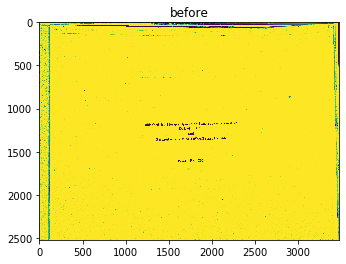

{4: 23, 3: 28, 2: 59, 1: 343}
threshold 2
image00001 Failed
image00002.jpg
(3410, 2573)
Processing image00002


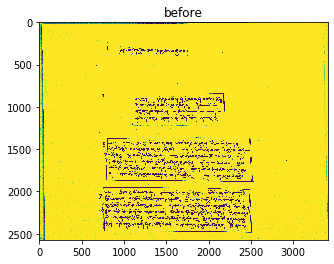

{4: 38, 1: 126, 2: 53, 3: 53}
threshold 2
[0, 828, 3410, 1188]
[0, 1355, 3410, 1894]
[0, 1942, 3410, 2492]
[0, 828, 3410, 1220.0]


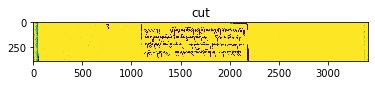

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-0.jpg !!!
[0, 1323.0, 3410, 1926.0]


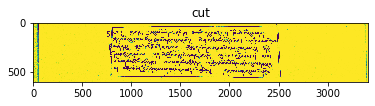

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-1.jpg !!!
[0, 1910.0, 3410, 2524.0]


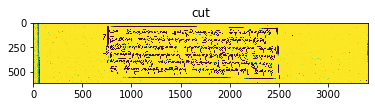

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-2.jpg !!!
image00003.jpg
(3540, 2558)
Processing image00003


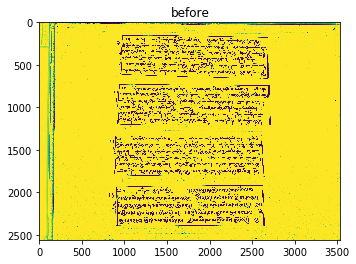

{3: 46, 1: 153, 2: 100, 4: 20}
threshold 2
[0, 147, 3540, 669]
[0, 721, 3540, 1222]
[0, 1313, 3540, 1820]
[0, 1906, 3540, 2404]
[0, 147, 3540, 719.8888888888889]


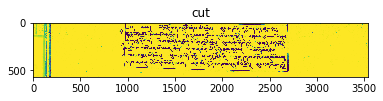

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00003-0.jpg !!!
[0, 670.1111111111111, 3540, 1272.888888888889]


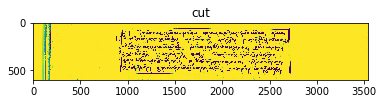

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00003-1.jpg !!!
[0, 1262.111111111111, 3540, 1870.888888888889]


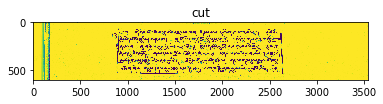

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00003-2.jpg !!!
[0, 1855.111111111111, 3540, 2454.8888888888887]


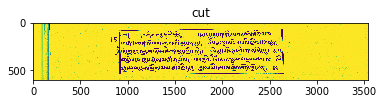

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00003-3.jpg !!!
image00004.jpg
(3553, 2581)
Processing image00004


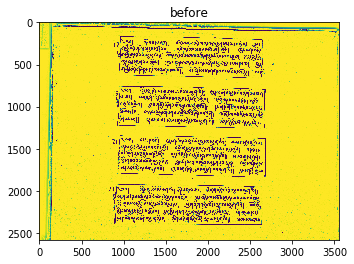

{3: 22, 2: 113, 1: 110, 4: 10}
threshold 2
[0, 161, 3553, 671]
[0, 752, 3553, 1266]
[0, 1336, 3553, 1847]
[0, 1914, 3553, 2409]
[0, 161, 3553, 719.4444444444445]


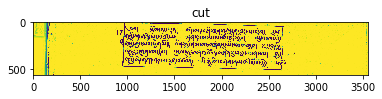

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00004-0.jpg !!!
[0, 703.5555555555555, 3553, 1314.4444444444443]


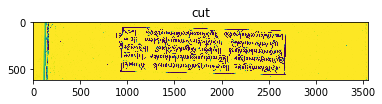

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00004-1.jpg !!!
[0, 1287.5555555555557, 3553, 1895.4444444444443]


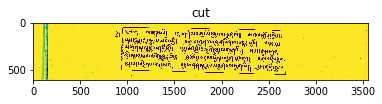

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00004-2.jpg !!!
[0, 1865.5555555555557, 3553, 2457.4444444444443]


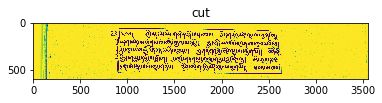

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00004-3.jpg !!!
image00005.jpg
(3533, 2599)
Processing image00005


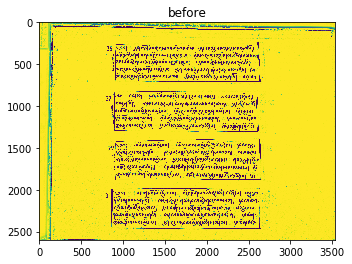

{4: 39, 3: 24, 1: 186, 2: 61}
threshold 2
[0, 248, 3533, 721]
[0, 814, 3533, 1315]
[0, 1383, 3533, 1894]
[0, 1971, 3533, 2476]
[0, 248, 3533, 773.8888888888889]


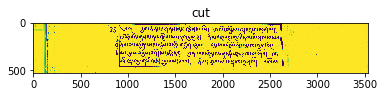

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00005-0.jpg !!!
[0, 761.1111111111111, 3533, 1367.888888888889]


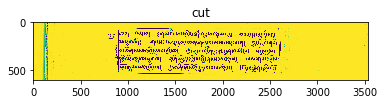

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00005-1.jpg !!!
[0, 1330.111111111111, 3533, 1946.888888888889]


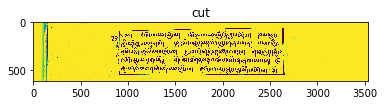

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00005-2.jpg !!!
[0, 1918.111111111111, 3533, 2528.8888888888887]


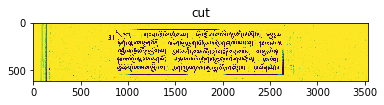

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00005-3.jpg !!!
image00006.jpg
(3520, 2594)
Processing image00006


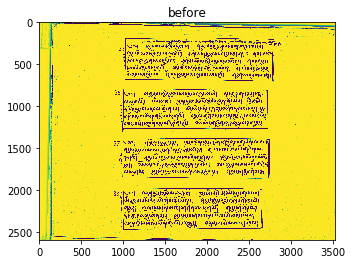

{4: 35, 2: 56, 3: 22, 1: 160}
threshold 2
[0, 181, 3520, 711]
[0, 788, 3520, 1281]
[0, 1370, 3520, 1871]
[0, 1970, 3520, 2479]
[0, 181, 3520, 769.8888888888889]


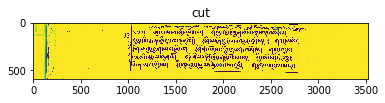

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00006-0.jpg !!!
[0, 729.1111111111111, 3520, 1339.888888888889]


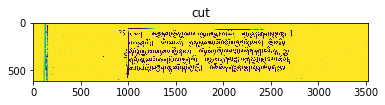

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00006-1.jpg !!!
[0, 1311.111111111111, 3520, 1929.888888888889]


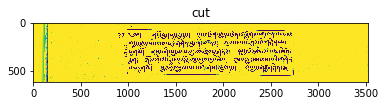

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00006-2.jpg !!!
[0, 1911.111111111111, 3520, 2537.8888888888887]


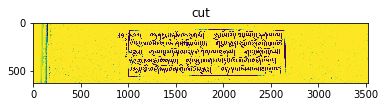

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00006-3.jpg !!!
image00007.jpg
(3484, 2586)
Processing image00007


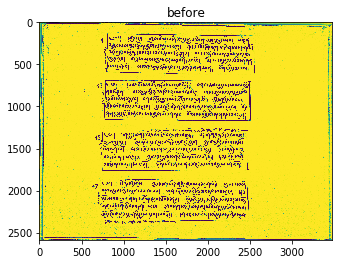

{3: 64, 1: 74, 4: 21, 2: 127}
threshold 2
[0, 130, 3484, 629]
[0, 681, 3484, 1181]
[0, 1252, 3484, 1772]
[0, 1851, 3484, 2574]
[0, 130, 3484, 673.8888888888889]


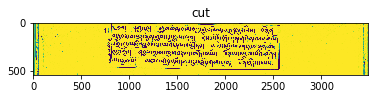

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00007-0.jpg !!!
[0, 636.1111111111111, 3484, 1225.888888888889]


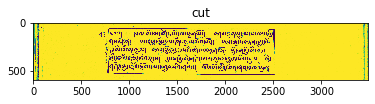

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00007-1.jpg !!!
[0, 1207.111111111111, 3484, 1816.888888888889]


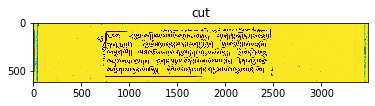

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00007-2.jpg !!!
[0, 1806.111111111111, 3484, 2585.0]


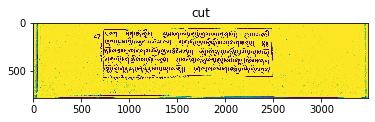

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00007-3.jpg !!!
image00008.jpg
(3445, 2541)
Processing image00008


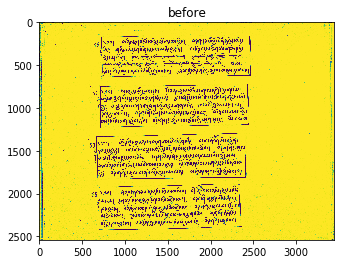

{3: 24, 4: 26, 2: 58, 1: 96}
threshold 2
[0, 151, 3445, 647]
[0, 722, 3445, 1233]
[0, 1288, 3445, 1840]
[0, 1881, 3445, 2432]
[0, 151, 3445, 685.0]


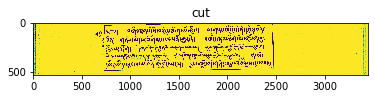

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00008-0.jpg !!!
[0, 684.0, 3445, 1271.0]


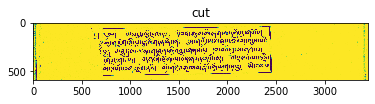

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00008-1.jpg !!!
[0, 1250.0, 3445, 1878.0]


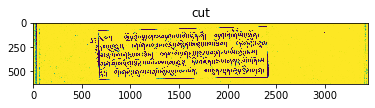

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00008-2.jpg !!!
[0, 1843.0, 3445, 2470.0]


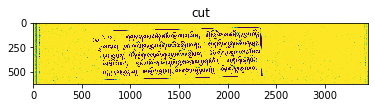

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00008-3.jpg !!!
image00009.jpg
(3439, 2575)
Processing image00009


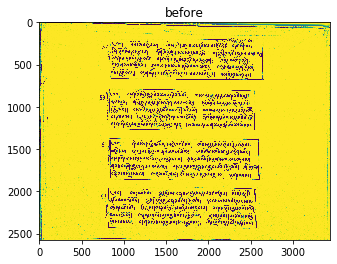

{4: 15, 2: 43, 3: 31, 1: 152}
threshold 2
[0, 189, 3439, 691]
[0, 783, 3439, 1288]
[0, 1369, 3439, 1876]
[0, 1947, 3439, 2447]
[0, 189, 3439, 745.2222222222222]


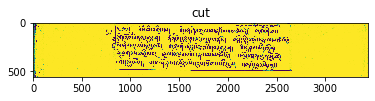

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00009-0.jpg !!!
[0, 728.7777777777778, 3439, 1342.2222222222222]


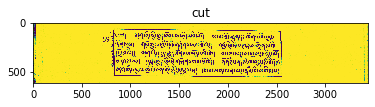

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00009-1.jpg !!!
[0, 1314.7777777777778, 3439, 1930.2222222222222]


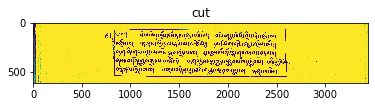

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00009-2.jpg !!!
[0, 1892.7777777777778, 3439, 2501.222222222222]


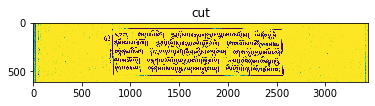

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00009-3.jpg !!!
image00010.jpg
(3550, 2592)
Processing image00010


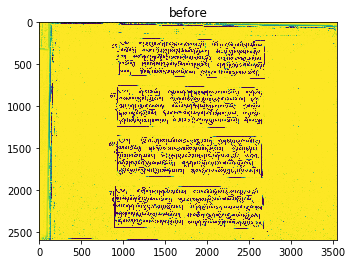

{3: 27, 2: 37, 1: 165, 4: 24}
threshold 2
[0, 181, 3550, 681]
[0, 746, 3550, 1227]
[0, 1341, 3550, 1861]
[0, 1940, 3550, 2470]
[0, 181, 3550, 738.3333333333334]


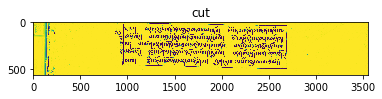

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00010-0.jpg !!!
[0, 688.6666666666666, 3550, 1284.3333333333333]


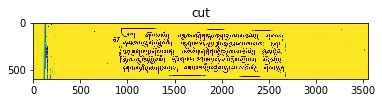

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00010-1.jpg !!!
[0, 1283.6666666666667, 3550, 1918.3333333333333]


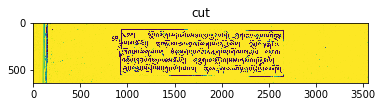

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00010-2.jpg !!!
[0, 1882.6666666666667, 3550, 2527.3333333333335]


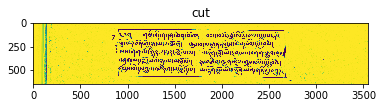

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00010-3.jpg !!!
image00011.jpg
(3434, 2577)
Processing image00011


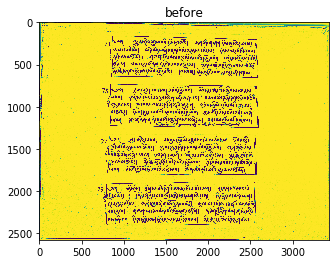

{4: 15, 2: 78, 1: 173, 3: 14}
threshold 2
[0, 157, 3434, 665]
[0, 728, 3434, 1257]
[0, 1321, 3434, 1812]
[0, 1881, 3434, 2410]
[0, 157, 3434, 708.5555555555555]


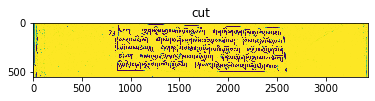

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00011-0.jpg !!!
[0, 684.4444444444445, 3434, 1300.5555555555557]


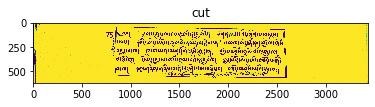

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00011-1.jpg !!!
[0, 1277.4444444444443, 3434, 1855.5555555555557]


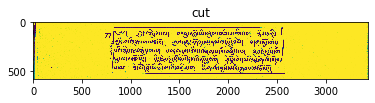

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00011-2.jpg !!!
[0, 1837.4444444444443, 3434, 2453.5555555555557]


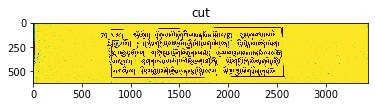

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00011-3.jpg !!!
image00012.jpg
(3581, 2553)
Processing image00012


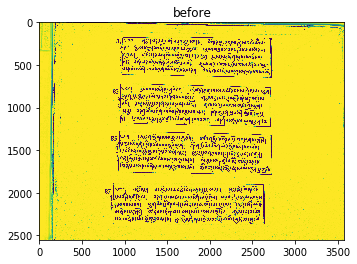

{4: 16, 3: 8, 2: 26, 1: 215}
threshold 2
[0, 168, 3581, 657]
[0, 716, 3581, 1233]
[0, 1277, 3581, 1793]
[0, 1885, 3581, 2379]
[0, 168, 3581, 700.3333333333334]


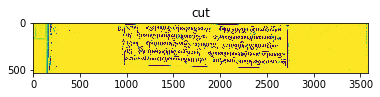

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00012-0.jpg !!!
[0, 672.6666666666666, 3581, 1276.3333333333333]


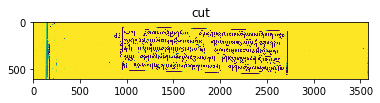

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00012-1.jpg !!!
[0, 1233.6666666666667, 3581, 1836.3333333333333]


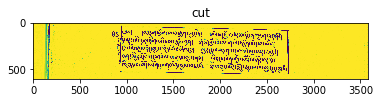

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00012-2.jpg !!!
[0, 1841.6666666666667, 3581, 2422.3333333333335]


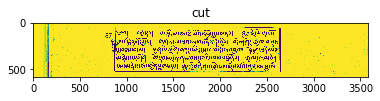

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00012-3.jpg !!!
image00013.jpg
(3437, 2585)
Processing image00013


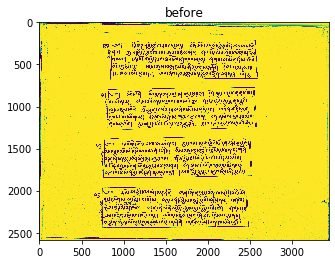

{1: 153, 2: 49, 3: 22, 4: 22}
threshold 2
[0, 201, 3437, 684]
[0, 768, 3437, 1282]
[0, 1352, 3437, 1854]
[0, 1943, 3437, 2447]
[0, 201, 3437, 738.0]


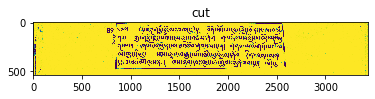

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00013-0.jpg !!!
[0, 714.0, 3437, 1336.0]


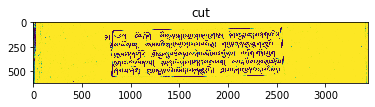

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00013-1.jpg !!!
[0, 1298.0, 3437, 1908.0]


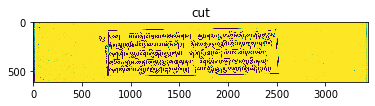

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00013-2.jpg !!!
[0, 1889.0, 3437, 2501.0]


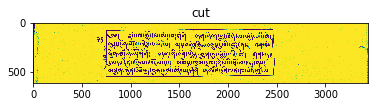

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00013-3.jpg !!!
image00014.jpg
(3601, 2568)
Processing image00014


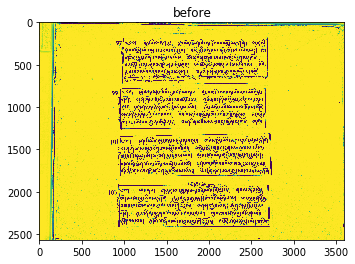

{4: 34, 3: 36, 2: 71, 1: 179}
threshold 2
[0, 178, 3601, 734]
[0, 767, 3601, 1266]
[0, 1307, 3601, 1826]
[0, 1883, 3601, 2424]
[0, 178, 3601, 763.1111111111111]


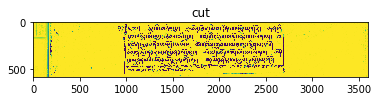

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00014-0.jpg !!!
[0, 737.8888888888889, 3601, 1295.111111111111]


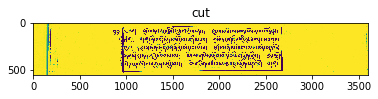

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00014-1.jpg !!!
[0, 1277.888888888889, 3601, 1855.111111111111]


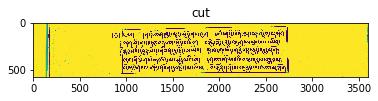

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00014-2.jpg !!!
[0, 1853.888888888889, 3601, 2453.1111111111113]


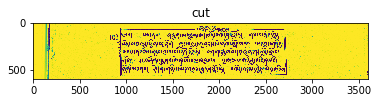

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00014-3.jpg !!!
image00015.jpg
(3576, 2550)
Processing image00015


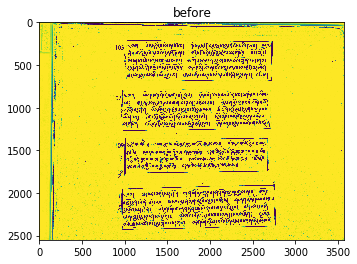

{4: 36, 3: 65, 2: 162, 1: 156}
threshold 2
[0, 206, 3576, 700]
[0, 782, 3576, 1279]
[0, 1348, 3576, 1791]
[0, 1901, 3576, 2439]
[0, 206, 3576, 758.0]


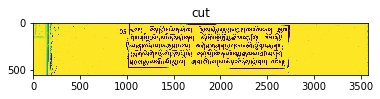

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00015-0.jpg !!!
[0, 724.0, 3576, 1337.0]


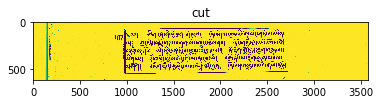

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00015-1.jpg !!!
[0, 1290.0, 3576, 1849.0]


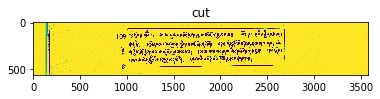

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00015-2.jpg !!!
[0, 1843.0, 3576, 2497.0]


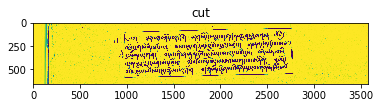

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00015-3.jpg !!!
image00016.jpg
(3426, 2561)
Processing image00016


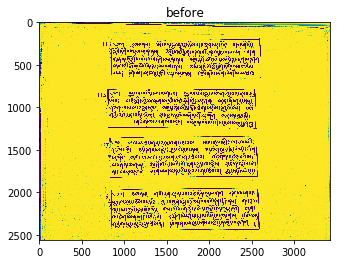

{4: 26, 3: 36, 2: 80, 1: 150}
threshold 2
[0, 189, 3426, 671]
[0, 778, 3426, 1257]
[0, 1336, 3426, 1834]
[0, 1944, 3426, 2455]
[0, 189, 3426, 736.7777777777778]


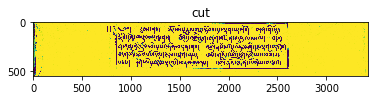

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00016-0.jpg !!!
[0, 712.2222222222222, 3426, 1322.7777777777778]


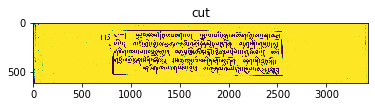

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00016-1.jpg !!!
[0, 1270.2222222222222, 3426, 1899.7777777777778]


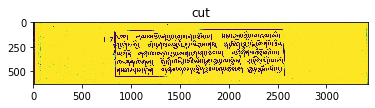

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00016-2.jpg !!!
[0, 1878.2222222222222, 3426, 2520.777777777778]


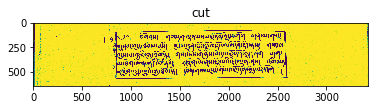

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00016-3.jpg !!!
image00017.jpg
(3576, 2533)
Processing image00017


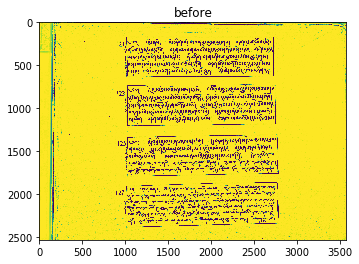

{1: 69, 2: 167, 3: 34, 4: 22}
threshold 2
[0, 163, 3576, 647]
[0, 719, 3576, 1214]
[0, 1303, 3576, 1800]
[0, 1855, 3576, 2521]
[0, 163, 3576, 695.0]


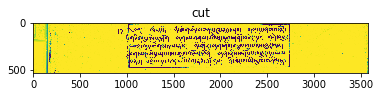

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00017-0.jpg !!!
[0, 671.0, 3576, 1262.0]


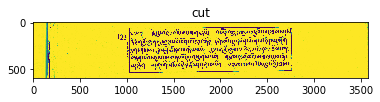

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00017-1.jpg !!!
[0, 1255.0, 3576, 1848.0]


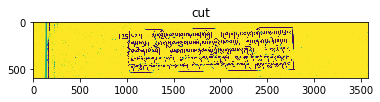

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00017-2.jpg !!!
[0, 1807.0, 3576, 2532.0]


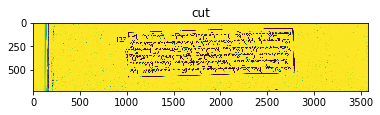

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00017-3.jpg !!!
image00018.jpg
(3465, 2585)
Processing image00018


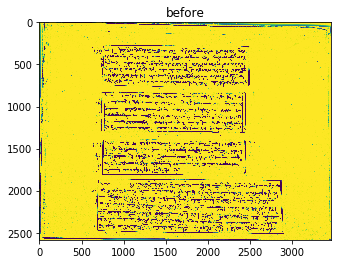

{2: 32, 1: 132, 3: 24, 4: 26}
threshold 2
[0, 268, 3465, 782]
[0, 821, 3465, 1327]
[0, 1385, 3465, 1820]
[0, 1857, 3465, 2520]
[0, 268, 3465, 811.7777777777778]


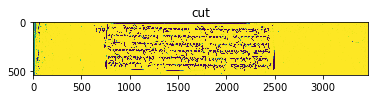

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00018-0.jpg !!!
[0, 791.2222222222222, 3465, 1356.7777777777778]


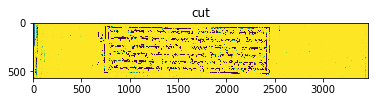

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00018-1.jpg !!!
[0, 1355.2222222222222, 3465, 1849.7777777777778]


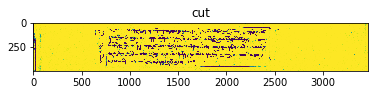

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00018-2.jpg !!!
[0, 1827.2222222222222, 3465, 2549.777777777778]


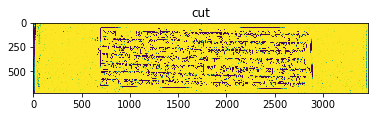

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00018-3.jpg !!!
image00019.jpg
(3557, 2555)
Processing image00019


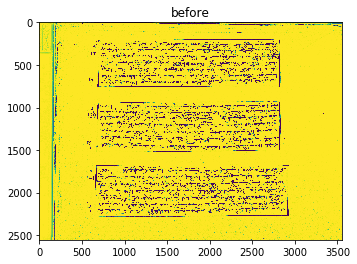

{1: 146, 2: 192, 3: 36, 4: 15}
threshold 2
[0, 194, 3557, 768]
[0, 923, 3557, 1527]
[0, 1664, 3557, 2289]
[0, 194, 3557, 859.3333333333334]


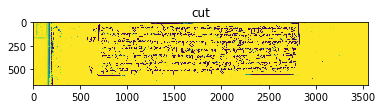

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00019-0.jpg !!!
[0, 831.6666666666666, 3557, 1618.3333333333333]


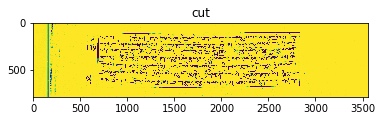

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00019-1.jpg !!!
[0, 1572.6666666666667, 3557, 2380.3333333333335]


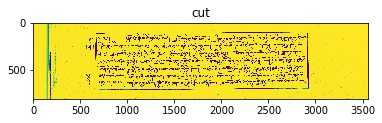

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00019-2.jpg !!!
image00020.jpg
(3580, 2537)
Processing image00020


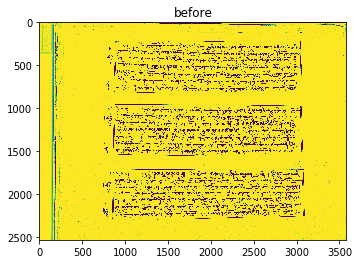

{1: 252, 2: 63, 3: 27, 4: 8}
threshold 2
[0, 210, 3580, 839]
[0, 951, 3580, 1570]
[0, 1702, 3580, 2307]
[0, 210, 3580, 920.3333333333334]


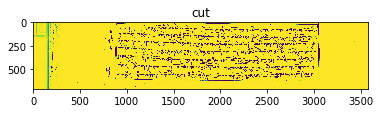

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00020-0.jpg !!!
[0, 869.6666666666666, 3580, 1651.3333333333333]


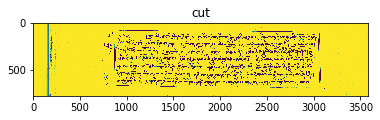

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00020-1.jpg !!!
[0, 1620.6666666666667, 3580, 2388.3333333333335]


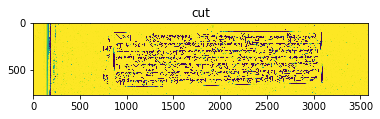

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00020-2.jpg !!!
image00021.jpg
(3586, 2575)
Processing image00021


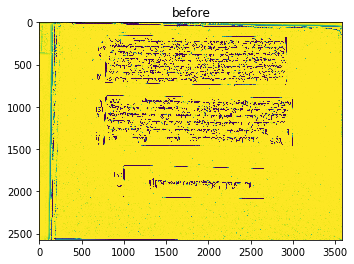

{4: 36, 3: 59, 2: 250, 1: 430}
threshold 2
[0, 145, 3586, 752]
[0, 859, 3586, 1476]
[0, 1768, 3586, 2095]
[0, 145, 3586, 823.3333333333334]


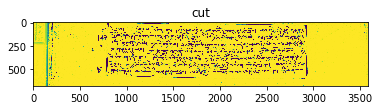

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00021-0.jpg !!!
[0, 787.6666666666666, 3586, 1547.3333333333333]


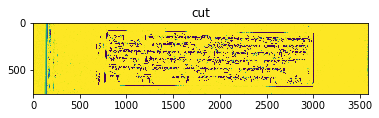

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00021-1.jpg !!!
[0, 1696.6666666666667, 3586, 2166.3333333333335]


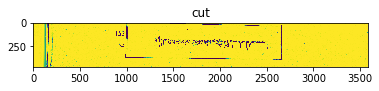

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00021-2.jpg !!!
image00022.jpg
(3421, 2564)
Processing image00022


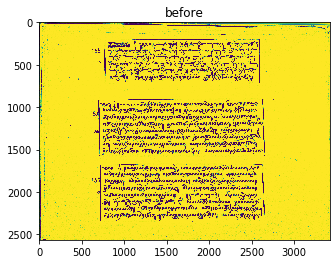

{2: 146, 1: 143, 3: 36, 4: 24}
threshold 2
[0, 195, 3421, 729]
[0, 894, 3421, 1589]
[0, 1660, 3421, 2354]
[0, 195, 3421, 776.3333333333334]


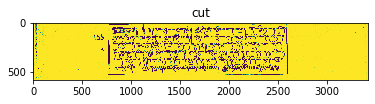

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00022-0.jpg !!!
[0, 846.6666666666666, 3421, 1636.3333333333333]


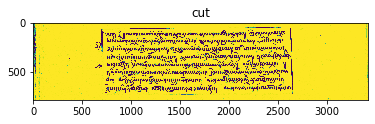

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00022-1.jpg !!!
[0, 1612.6666666666667, 3421, 2401.3333333333335]


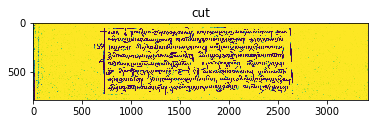

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00022-2.jpg !!!
image00023.jpg
(3427, 2590)
Processing image00023


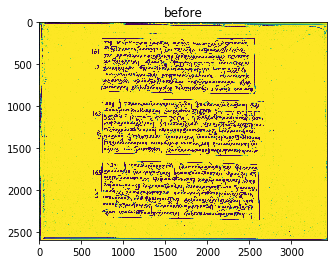

{2: 35, 1: 215, 4: 10, 3: 8}
threshold 2
[0, 182, 3427, 861]
[0, 903, 3427, 1601]
[0, 1640, 3427, 2364]
[0, 182, 3427, 888.0]


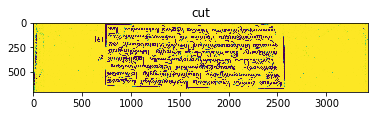

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00023-0.jpg !!!
[0, 876.0, 3427, 1628.0]


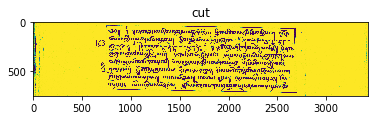

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00023-1.jpg !!!
[0, 1613.0, 3427, 2391.0]


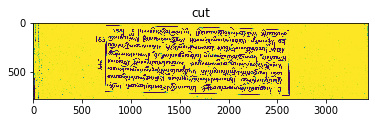

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00023-2.jpg !!!
image00024.jpg
(3456, 2554)
Processing image00024


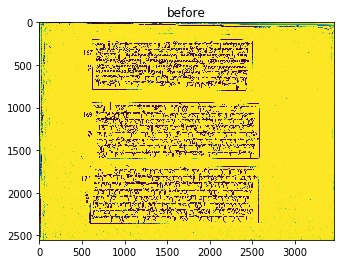

{4: 19, 2: 147, 1: 130, 3: 19}
threshold 2
[0, 188, 3456, 813]
[0, 930, 3456, 1613]
[0, 1673, 3456, 2371]
[0, 188, 3456, 872.0]


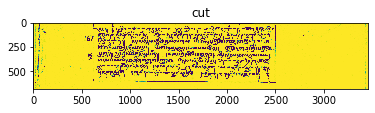

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00024-0.jpg !!!
[0, 871.0, 3456, 1672.0]


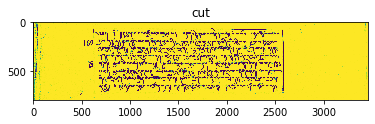

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00024-1.jpg !!!
[0, 1614.0, 3456, 2430.0]


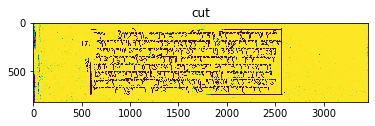

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00024-2.jpg !!!
image00025.jpg
(3460, 2594)
Processing image00025


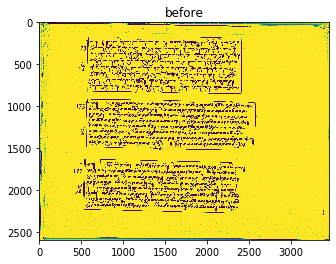

{1: 253, 2: 30, 4: 8, 3: 14}
threshold 2
[0, 165, 3460, 861]
[0, 911, 3460, 1534]
[0, 1622, 3460, 2285]
[0, 165, 3460, 907.0]


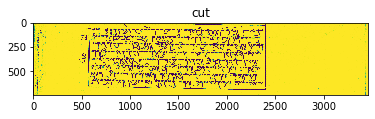

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00025-0.jpg !!!
[0, 865.0, 3460, 1580.0]


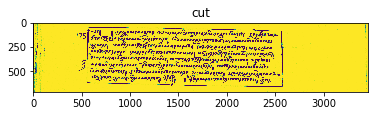

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00025-1.jpg !!!
[0, 1576.0, 3460, 2331.0]


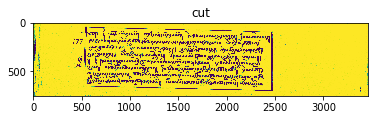

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00025-2.jpg !!!
image00026.jpg
(3487, 2852)
Processing image00026


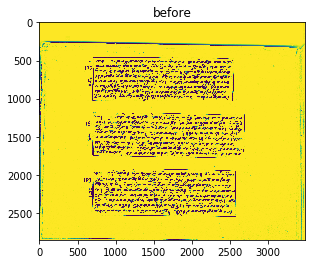

{1: 18, 2: 4, 3: 12, 4: 14}
threshold 2
[0, 454, 3487, 1048]
[0, 1177, 3487, 1790]
[0, 1914, 3487, 2553]
[0, 454, 3487, 1132.3333333333333]


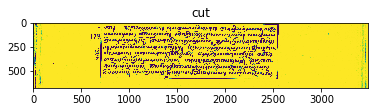

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00026-0.jpg !!!
[0, 1092.6666666666667, 3487, 1874.3333333333333]


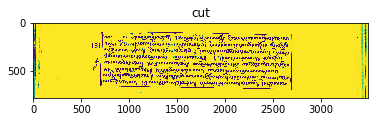

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00026-1.jpg !!!
[0, 1829.6666666666667, 3487, 2637.3333333333335]


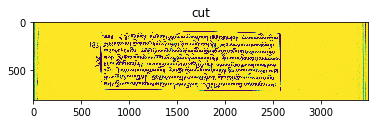

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00026-2.jpg !!!
image00027.jpg
(3441, 2587)
Processing image00027


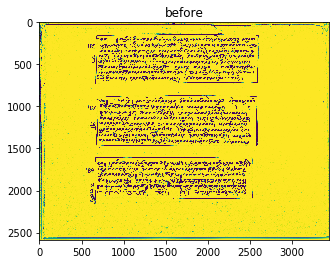

{1: 297, 3: 68, 4: 31, 2: 156}
threshold 2
[0, 128, 3441, 736]
[0, 863, 3441, 1480]
[0, 1595, 3441, 2140]
[0, 2391, 3441, 2522]
[0, 128, 3441, 816.6666666666666]


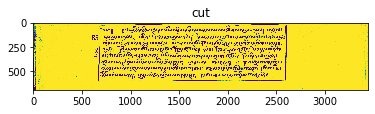

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00027-0.jpg !!!
[0, 782.3333333333334, 3441, 1560.6666666666667]


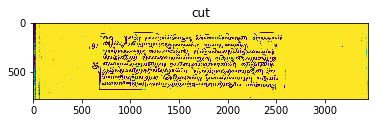

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00027-1.jpg !!!
[0, 1514.3333333333333, 3441, 2220.6666666666665]


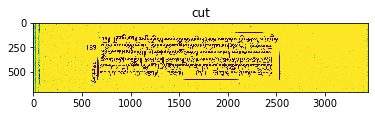

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00027-2.jpg !!!
[0, 2310.3333333333335, 3441, 2586.0]


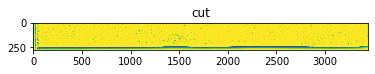

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00027-3.jpg !!!
image00028.jpg
(3437, 2543)
Processing image00028


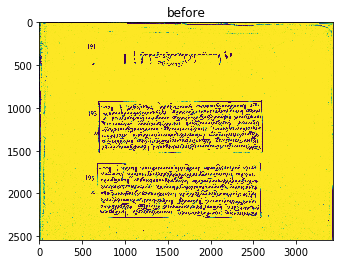

{1: 255, 2: 106, 3: 39, 4: 26}
threshold 2
[0, 342, 3437, 519]
[0, 914, 3437, 1531]
[0, 1632, 3437, 2297]
[0, 286.33333333333337, 3437, 586.3333333333334]


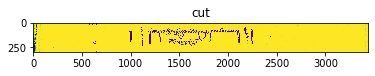

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00028-0.jpg !!!
[0, 846.6666666666666, 3437, 1598.3333333333333]


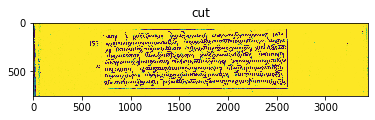

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00028-1.jpg !!!
[0, 1564.6666666666667, 3437, 2364.3333333333335]


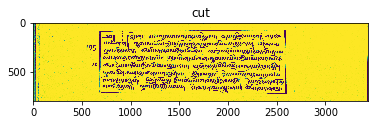

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00028-2.jpg !!!
image00029.jpg
(3414, 2544)
Processing image00029


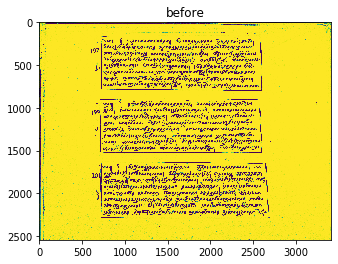

{2: 137, 1: 149, 4: 22, 3: 36}
threshold 2
[0, 149, 3414, 809]
[0, 888, 3414, 1536]
[0, 1624, 3414, 2301]
[0, 149, 3414, 864.6666666666666]


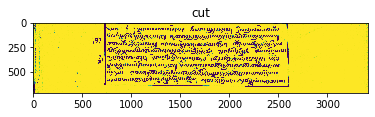

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00029-0.jpg !!!
[0, 832.3333333333334, 3414, 1591.6666666666667]


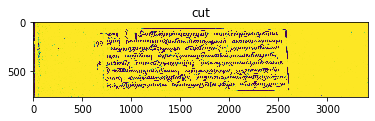

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00029-1.jpg !!!
[0, 1568.3333333333333, 3414, 2356.6666666666665]


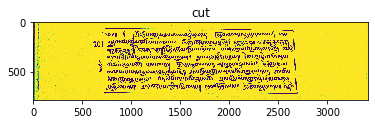

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00029-2.jpg !!!
image00030.jpg
(3417, 2545)
Processing image00030


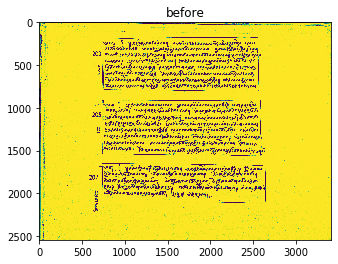

{1: 208, 2: 196, 3: 110, 4: 52}
threshold 2
[0, 169, 3417, 817]
[0, 903, 3417, 1567]
[0, 1642, 3417, 2221]
[0, 2398, 3417, 2533]
[0, 169, 3417, 870.6666666666666]


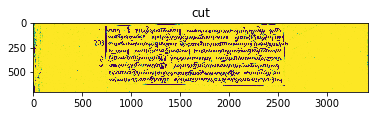

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00030-0.jpg !!!
[0, 849.3333333333334, 3417, 1620.6666666666667]


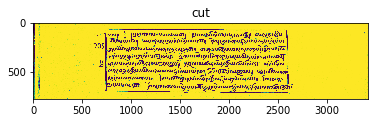

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00030-1.jpg !!!
[0, 1588.3333333333333, 3417, 2274.6666666666665]


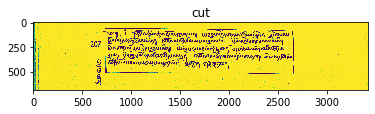

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00030-2.jpg !!!
[0, 2344.3333333333335, 3417, 2544.0]


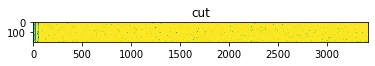

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00030-3.jpg !!!
image00031.jpg
(3409, 2597)
Processing image00031


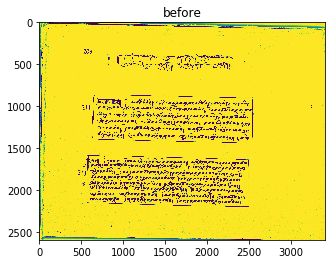

{2: 59, 3: 34, 1: 279, 4: 15}
threshold 2
[0, 323, 3409, 576]
[0, 858, 3409, 1448]
[0, 1582, 3409, 2209]
[0, 323, 3409, 665.3333333333334]


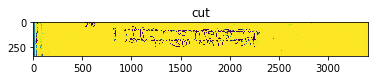

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00031-0.jpg !!!
[0, 768.6666666666666, 3409, 1537.3333333333333]


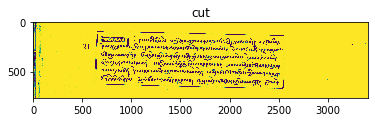

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00031-1.jpg !!!
[0, 1492.6666666666667, 3409, 2298.3333333333335]


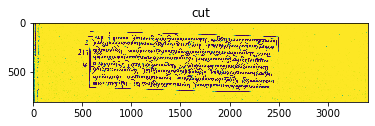

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00031-2.jpg !!!
image00032.jpg
(3415, 2570)
Processing image00032


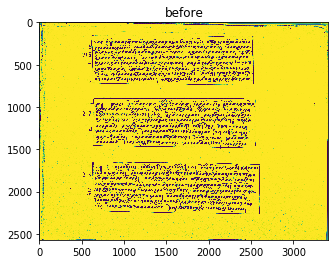

{4: 12, 1: 174, 2: 182, 3: 31}
threshold 2
[0, 151, 3415, 745]
[0, 889, 3415, 1493]
[0, 1643, 3415, 2271]
[0, 2378, 3415, 2540]
[0, 151, 3415, 828.6666666666666]


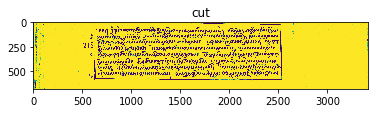

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00032-0.jpg !!!
[0, 805.3333333333334, 3415, 1576.6666666666667]


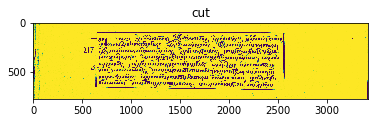

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00032-1.jpg !!!
[0, 1559.3333333333333, 3415, 2354.6666666666665]


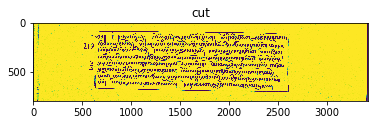

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00032-2.jpg !!!
[0, 2294.3333333333335, 3415, 2569.0]


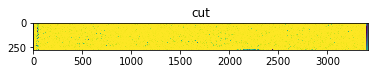

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00032-3.jpg !!!
image00033.jpg
(3528, 2517)
Processing image00033


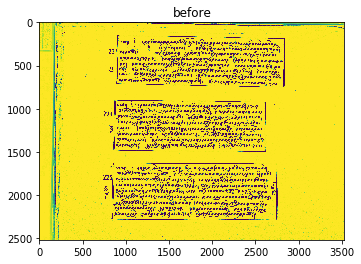

{3: 28, 2: 130, 1: 170, 4: 22}
threshold 2
[0, 148, 3528, 759]
[0, 895, 3528, 1505]
[0, 1617, 3528, 2295]
[0, 148, 3528, 841.6666666666666]


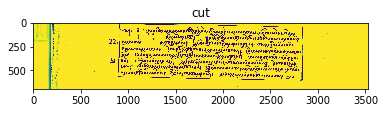

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00033-0.jpg !!!
[0, 812.3333333333334, 3528, 1587.6666666666667]


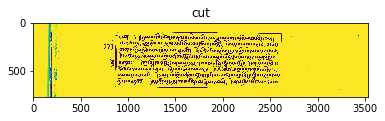

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00033-1.jpg !!!
[0, 1534.3333333333333, 3528, 2377.6666666666665]


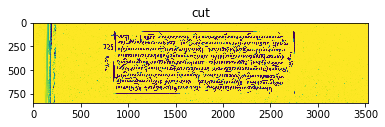

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00033-2.jpg !!!
image00034.jpg
(3545, 2557)
Processing image00034


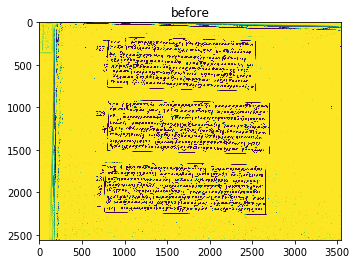

{4: 4, 3: 13, 2: 88, 1: 265}
threshold 2
[0, 162, 3545, 816]
[0, 906, 3545, 1557]
[0, 1639, 3545, 2267]
[0, 162, 3545, 873.3333333333334]


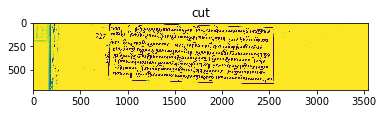

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00034-0.jpg !!!
[0, 848.6666666666666, 3545, 1614.3333333333333]


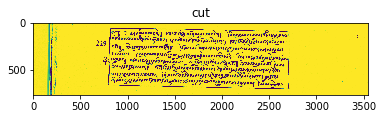

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00034-1.jpg !!!
[0, 1581.6666666666667, 3545, 2324.3333333333335]


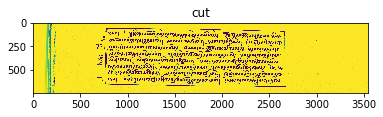

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00034-2.jpg !!!
image00035.jpg
(3416, 2559)
Processing image00035


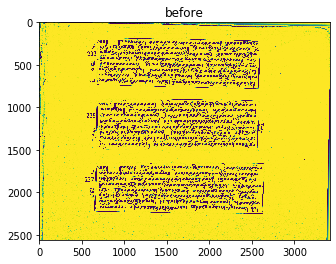

{3: 24, 1: 226, 2: 144, 4: 17}
threshold 2
[0, 181, 3416, 788]
[0, 895, 3416, 1515]
[0, 1644, 3416, 2258]
[0, 181, 3416, 866.6666666666666]


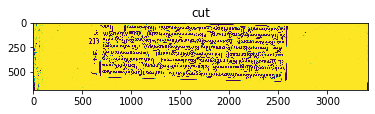

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00035-0.jpg !!!
[0, 816.3333333333334, 3416, 1593.6666666666667]


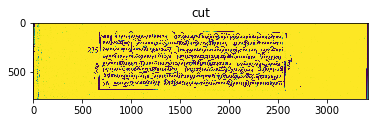

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00035-1.jpg !!!
[0, 1565.3333333333333, 3416, 2336.6666666666665]


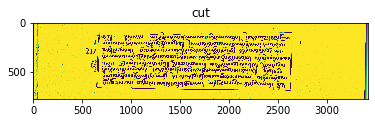

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00035-2.jpg !!!
image00036.jpg
(3421, 2590)
Processing image00036


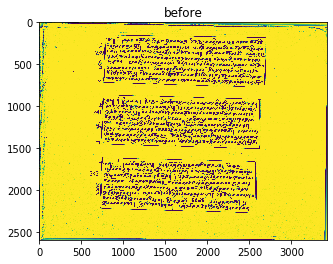

{4: 11, 3: 7, 1: 266, 2: 77}
threshold 2
[0, 138, 3421, 781]
[0, 860, 3421, 1512]
[0, 1606, 3421, 2278]
[0, 138, 3421, 838.6666666666666]


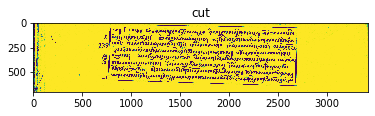

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00036-0.jpg !!!
[0, 802.3333333333334, 3421, 1569.6666666666667]


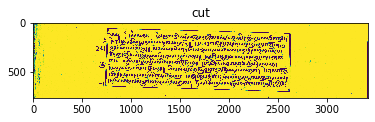

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00036-1.jpg !!!
[0, 1548.3333333333333, 3421, 2335.6666666666665]


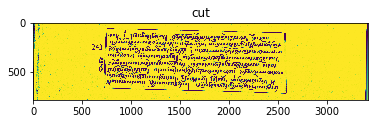

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00036-2.jpg !!!
image00037.jpg
(3483, 2566)
Processing image00037


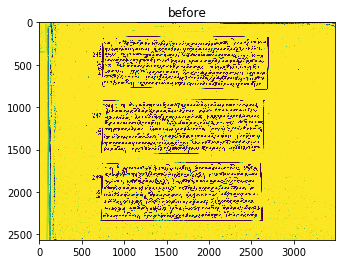

{1: 121, 2: 139, 3: 36, 4: 36}
threshold 2
[0, 157, 3483, 804]
[0, 903, 3483, 1563]
[0, 1644, 3483, 2351]
[0, 2414, 3483, 2554]
[0, 157, 3483, 858.0]


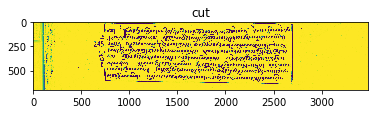

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00037-0.jpg !!!
[0, 849.0, 3483, 1617.0]


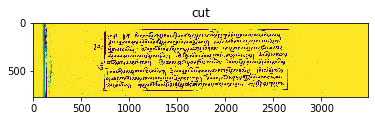

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00037-1.jpg !!!
[0, 1590.0, 3483, 2405.0]


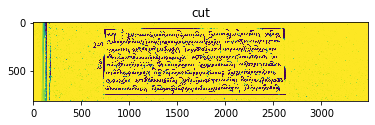

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00037-2.jpg !!!
[0, 2360.0, 3483, 2565.0]


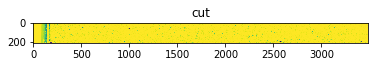

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00037-3.jpg !!!
image00038.jpg
(3421, 2537)
Processing image00038


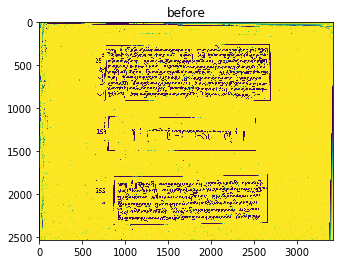

{1: 288, 3: 108, 4: 34, 2: 192}
threshold 2
[0, 250, 3421, 930]
[0, 1154, 3421, 1451]
[0, 1817, 3421, 2372]
[0, 250, 3421, 996.6666666666666]


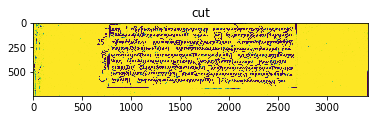

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00038-0.jpg !!!
[0, 1087.3333333333333, 3421, 1517.6666666666667]


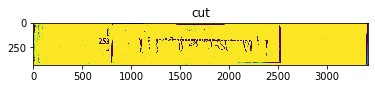

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00038-1.jpg !!!
[0, 1750.3333333333333, 3421, 2438.6666666666665]


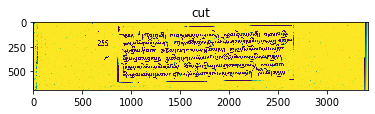

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00038-2.jpg !!!
image00039.jpg
(3565, 2524)
Processing image00039


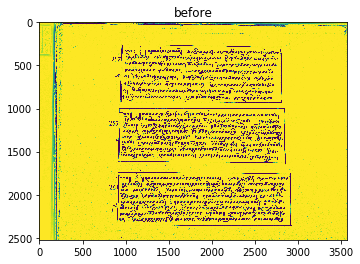

{4: 32, 2: 177, 3: 79, 1: 166}
threshold 2
[0, 256, 3565, 942]
[0, 989, 3565, 1641]
[0, 1729, 3565, 2369]
[0, 2381, 3565, 2512]
[0, 256, 3565, 974.6666666666666]


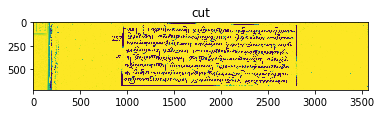

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00039-0.jpg !!!
[0, 956.3333333333334, 3565, 1673.6666666666667]


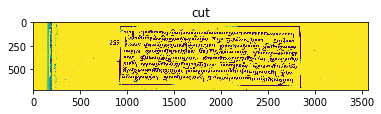

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00039-1.jpg !!!
[0, 1696.3333333333333, 3565, 2401.6666666666665]


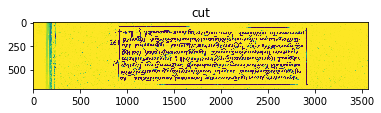

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00039-2.jpg !!!
[0, 2348.3333333333335, 3565, 2523.0]


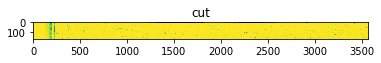

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00039-3.jpg !!!
image00040.jpg
(3492, 2564)
Processing image00040


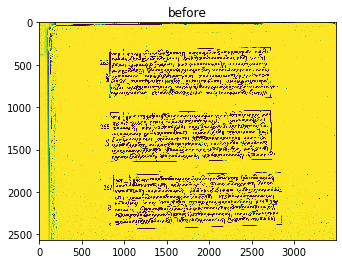

{1: 107, 3: 17, 2: 94, 4: 10}
threshold 2
[0, 291, 3492, 907]
[0, 1030, 3492, 1654]
[0, 1762, 3492, 2449]
[0, 291, 3492, 984.0]


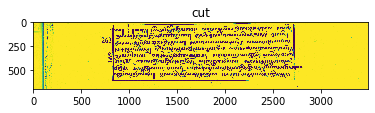

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00040-0.jpg !!!
[0, 953.0, 3492, 1731.0]


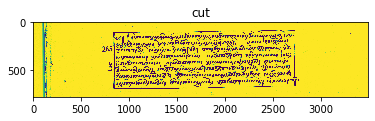

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00040-1.jpg !!!
[0, 1685.0, 3492, 2526.0]


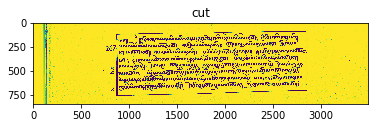

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00040-2.jpg !!!
image00041.jpg
(3363, 2560)
Processing image00041


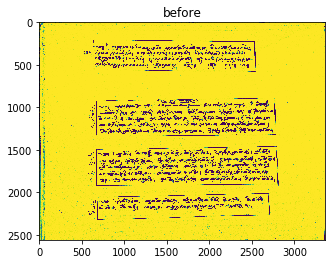

{3: 41, 2: 216, 1: 152, 4: 25}
threshold 2
[0, 201, 3363, 590]
[0, 885, 3363, 1351]
[0, 1451, 3363, 1930]
[0, 2003, 3363, 2354]
[0, 201, 3363, 647.6666666666666]


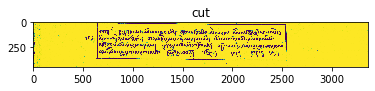

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00041-0.jpg !!!
[0, 827.3333333333334, 3363, 1408.6666666666667]


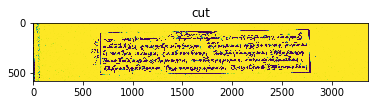

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00041-1.jpg !!!
[0, 1393.3333333333333, 3363, 1987.6666666666667]


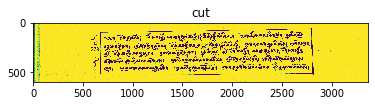

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00041-2.jpg !!!
[0, 1945.3333333333333, 3363, 2411.6666666666665]


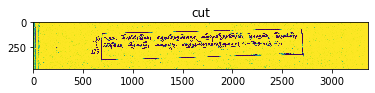

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00041-3.jpg !!!
image00042.jpg
(3384, 2564)
Processing image00042


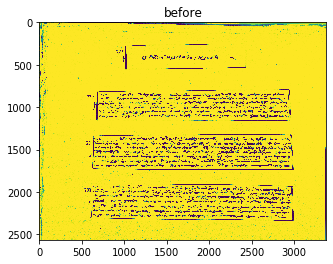

{1: 284, 2: 231, 4: 42, 3: 103}
threshold 2
[0, 320, 3384, 468]
[0, 786, 3384, 1168]
[0, 1313, 3384, 1747]
[0, 1893, 3384, 2348]
[0, 2351, 3384, 2552]
[0, 233.33333333333337, 3384, 533.3333333333334]


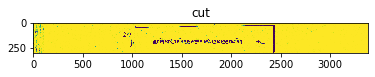

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-0.jpg !!!
[0, 720.6666666666666, 3384, 1233.3333333333333]


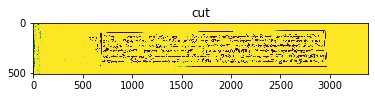

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-1.jpg !!!
[0, 1247.6666666666667, 3384, 1812.3333333333333]


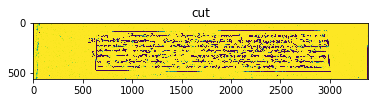

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-2.jpg !!!
[0, 1827.6666666666667, 3384, 2413.3333333333335]


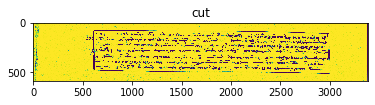

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-3.jpg !!!
[0, 2285.6666666666665, 3384, 2563.0]


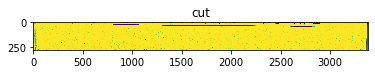

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-4.jpg !!!
image00043.jpg
(3381, 2995)
Processing image00043


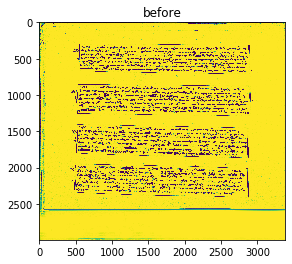

{1: 130, 3: 17, 2: 69, 4: 11}
threshold 2
[0, 293, 3381, 724]
[0, 849, 3381, 1298]
[0, 1401, 3381, 1874]
[0, 1943, 3381, 2418]
[0, 293, 3381, 790.0]


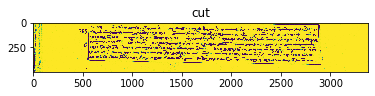

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00043-0.jpg !!!
[0, 783.0, 3381, 1364.0]


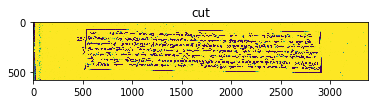

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00043-1.jpg !!!
[0, 1335.0, 3381, 1940.0]


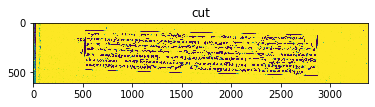

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00043-2.jpg !!!
[0, 1877.0, 3381, 2484.0]


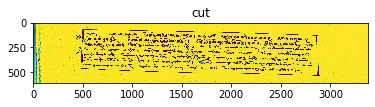

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00043-3.jpg !!!
image00044.jpg
(3542, 2547)
Processing image00044


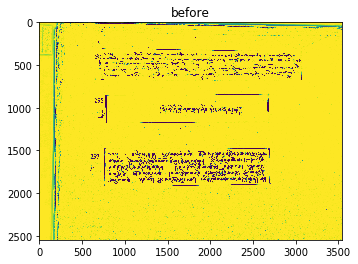

{4: 43, 3: 104, 2: 408, 1: 534}
threshold 2
[0, 10, 3542, 166]
[0, 301, 3542, 692]
[0, 881, 3542, 1188]
[0, 1463, 3542, 1928]
[0, 2378, 3542, 2535]
[0, 0, 3542, 256.0]


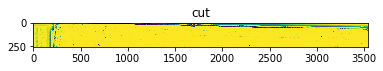

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00044-0.jpg !!!
[0, 211.0, 3542, 782.0]


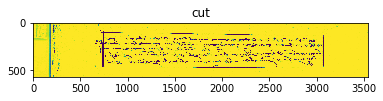

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00044-1.jpg !!!
[0, 791.0, 3542, 1278.0]


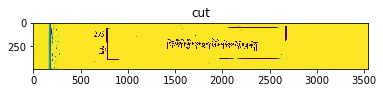

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00044-2.jpg !!!
[0, 1373.0, 3542, 2018.0]


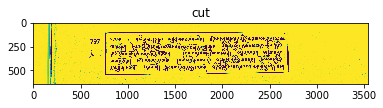

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00044-3.jpg !!!
[0, 2288.0, 3542, 2546.0]


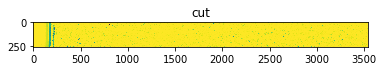

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00044-4.jpg !!!
image00045.jpg
(3579, 2561)
Processing image00045


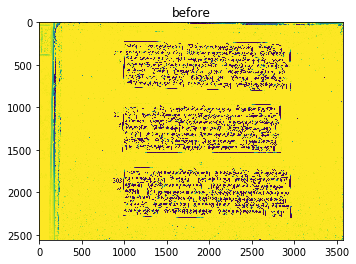

{2: 136, 3: 32, 4: 20, 1: 201}
threshold 2
[0, 220, 3579, 821]
[0, 950, 3579, 1547]
[0, 1690, 3579, 2314]
[0, 220, 3579, 911.6666666666666]


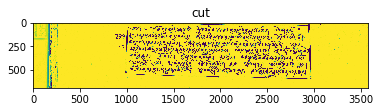

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00045-0.jpg !!!
[0, 859.3333333333334, 3579, 1637.6666666666667]


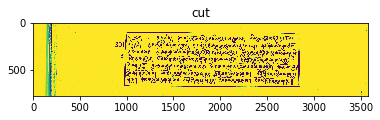

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00045-1.jpg !!!
[0, 1599.3333333333333, 3579, 2404.6666666666665]


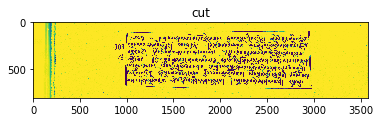

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00045-2.jpg !!!
image00046.jpg
(3396, 2569)
Processing image00046


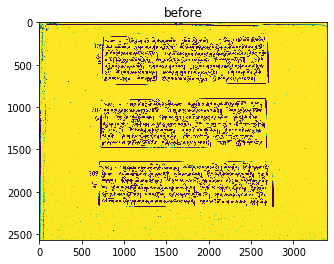

{4: 19, 3: 42, 2: 185, 1: 236}
threshold 2
[0, 153, 3396, 750]
[0, 891, 3396, 1493]
[0, 1629, 3396, 2192]
[0, 2432, 3396, 2557]
[0, 153, 3396, 842.3333333333334]


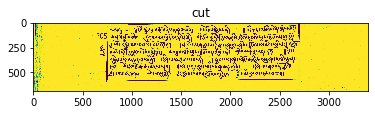

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00046-0.jpg !!!
[0, 798.6666666666666, 3396, 1585.3333333333333]


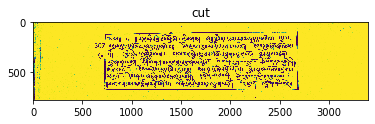

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00046-1.jpg !!!
[0, 1536.6666666666667, 3396, 2284.3333333333335]


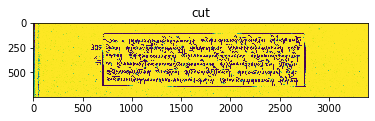

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00046-2.jpg !!!
[0, 2339.6666666666665, 3396, 2568.0]


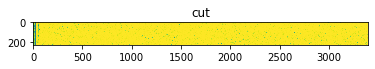

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00046-3.jpg !!!
image00047.jpg
(3393, 2560)
Processing image00047


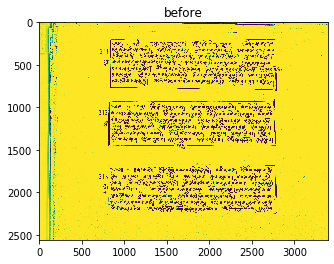

{1: 303, 2: 103, 4: 10, 3: 24}
threshold 2
[0, 187, 3393, 804]
[0, 920, 3393, 1473]
[0, 1665, 3393, 2256]
[0, 187, 3393, 881.3333333333334]


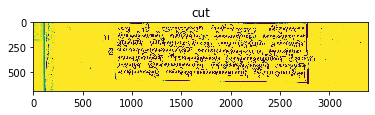

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00047-0.jpg !!!
[0, 842.6666666666666, 3393, 1550.3333333333333]


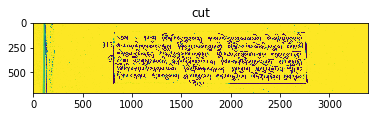

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00047-1.jpg !!!
[0, 1587.6666666666667, 3393, 2333.3333333333335]


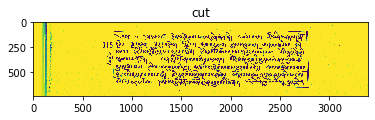

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00047-2.jpg !!!
image00048.jpg
(3564, 2561)
Processing image00048


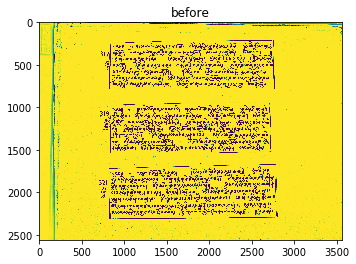

{3: 21, 2: 201, 1: 136, 4: 4}
threshold 2
[0, 207, 3564, 799]
[0, 938, 3564, 1552]
[0, 1665, 3564, 2322]
[0, 2357, 3564, 2549]
[0, 207, 3564, 862.7777777777778]


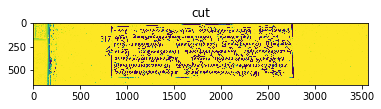

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00048-0.jpg !!!
[0, 874.2222222222222, 3564, 1615.7777777777778]


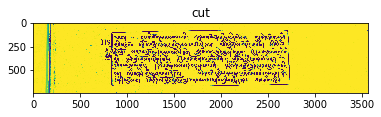

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00048-1.jpg !!!
[0, 1601.2222222222222, 3564, 2385.777777777778]


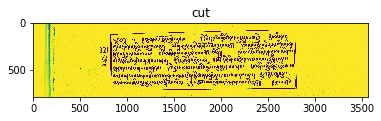

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00048-2.jpg !!!
[0, 2293.222222222222, 3564, 2560.0]


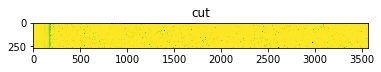

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00048-3.jpg !!!
image00049.jpg
(3559, 2587)
Processing image00049


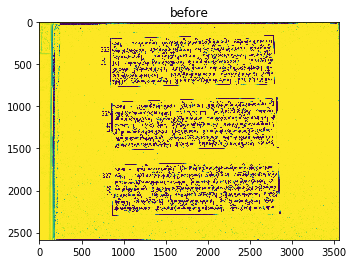

{4: 10, 2: 123, 1: 224, 3: 14}
threshold 2
[0, 152, 3559, 778]
[0, 895, 3559, 1527]
[0, 1660, 3559, 2304]
[0, 152, 3559, 861.3333333333334]


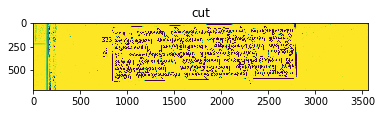

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00049-0.jpg !!!
[0, 811.6666666666666, 3559, 1610.3333333333333]


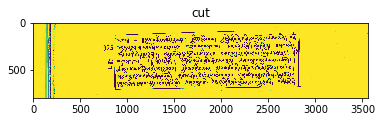

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00049-1.jpg !!!
[0, 1576.6666666666667, 3559, 2387.3333333333335]


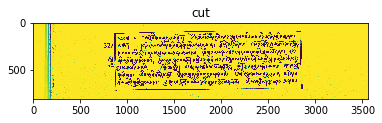

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00049-2.jpg !!!
image00050.jpg
(3404, 2578)
Processing image00050


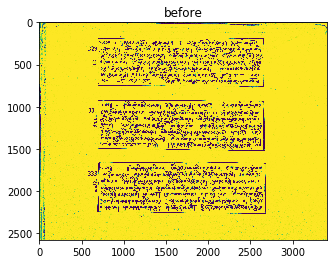

{1: 199, 2: 151, 3: 26, 4: 27}
threshold 2
[0, 180, 3404, 771]
[0, 916, 3404, 1531]
[0, 1648, 3404, 2275]
[0, 180, 3404, 858.3333333333334]


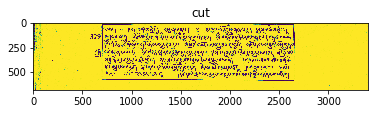

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00050-0.jpg !!!
[0, 828.6666666666666, 3404, 1618.3333333333333]


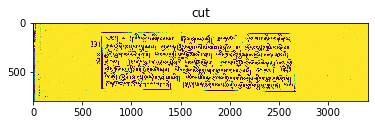

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00050-1.jpg !!!
[0, 1560.6666666666667, 3404, 2362.3333333333335]


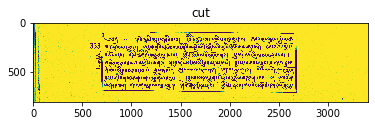

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00050-2.jpg !!!
image00051.jpg
(3565, 2575)
Processing image00051


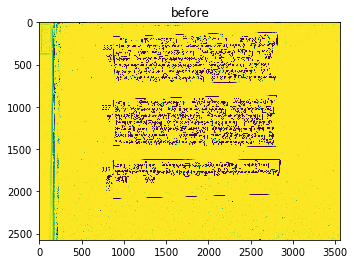

{4: 39, 3: 39, 2: 191, 1: 397}
threshold 2
[0, 114, 3565, 731]
[0, 861, 3565, 1479]
[0, 1611, 3565, 2093]
[0, 114, 3565, 818.3333333333334]


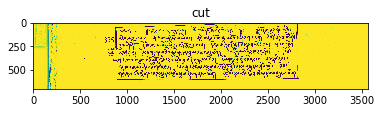

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00051-0.jpg !!!
[0, 773.6666666666666, 3565, 1566.3333333333333]


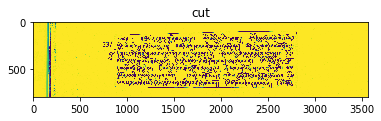

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00051-1.jpg !!!
[0, 1523.6666666666667, 3565, 2180.3333333333335]


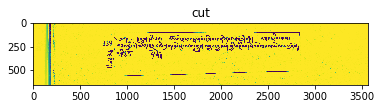

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00051-2.jpg !!!
image00052.jpg
(3403, 2564)
Processing image00052


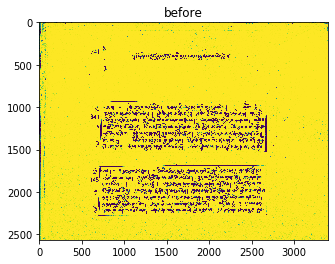

{3: 82, 2: 194, 1: 247, 4: 21}
threshold 2
[0, 317, 3403, 454]
[0, 916, 3403, 1543]
[0, 1675, 3403, 2292]
[0, 2346, 3403, 2552]
[0, 216.0, 3403, 516.0]


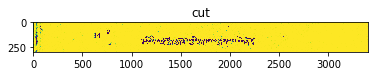

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-0.jpg !!!
[0, 854.0, 3403, 1605.0]


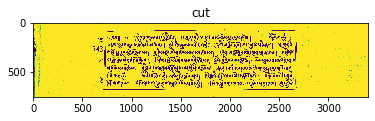

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-1.jpg !!!
[0, 1613.0, 3403, 2354.0]


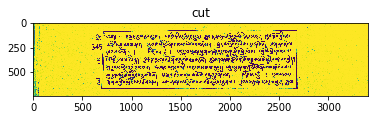

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-2.jpg !!!
[0, 2284.0, 3403, 2563.0]


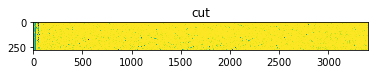

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-3.jpg !!!
image00053.jpg
(3570, 2555)
Processing image00053


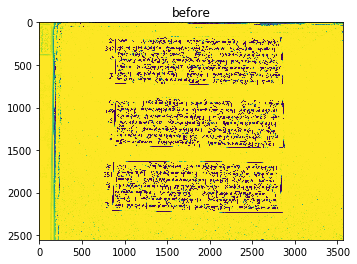

{1: 241, 2: 145, 3: 30, 4: 14}
threshold 2
[0, 161, 3570, 748]
[0, 876, 3570, 1483]
[0, 1625, 3570, 2243]
[0, 161, 3570, 838.0]


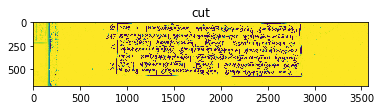

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00053-0.jpg !!!
[0, 786.0, 3570, 1573.0]


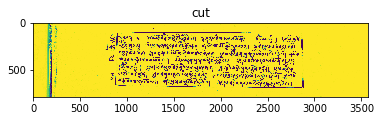

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00053-1.jpg !!!
[0, 1535.0, 3570, 2333.0]


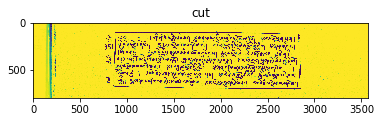

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00053-2.jpg !!!
image00054.jpg
(3408, 2569)
Processing image00054


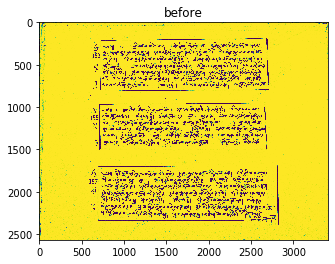

{3: 23, 2: 117, 1: 205, 4: 25}
threshold 2
[0, 183, 3408, 821]
[0, 947, 3408, 1473]
[0, 1690, 3408, 2386]
[0, 183, 3408, 905.0]


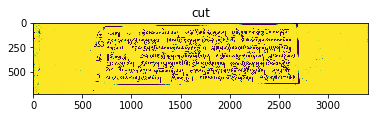

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00054-0.jpg !!!
[0, 863.0, 3408, 1557.0]


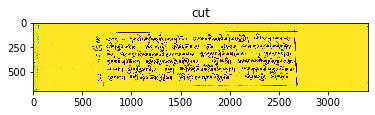

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00054-1.jpg !!!
[0, 1606.0, 3408, 2470.0]


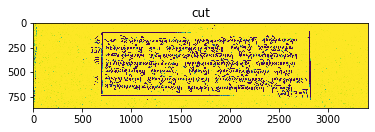

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00054-2.jpg !!!
image00055.jpg
(3409, 2577)
Processing image00055


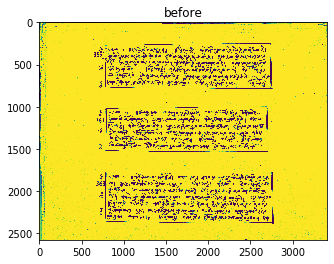

{4: 27, 1: 135, 3: 19, 2: 136}
threshold 2
[0, 245, 3409, 797]
[0, 991, 3409, 1544]
[0, 1760, 3409, 2382]
[0, 245, 3409, 863.6666666666666]


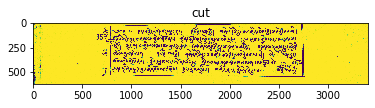

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00055-0.jpg !!!
[0, 924.3333333333334, 3409, 1610.6666666666667]


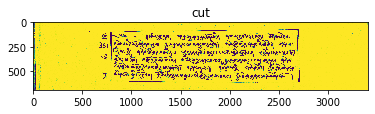

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00055-1.jpg !!!
[0, 1693.3333333333333, 3409, 2448.6666666666665]


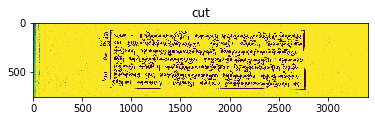

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00055-2.jpg !!!
image00056.jpg
(3562, 2610)
Processing image00056


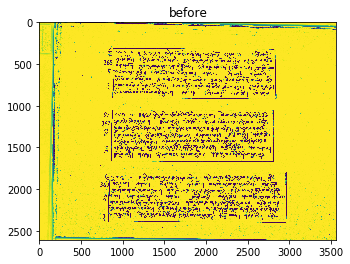

{4: 30, 3: 30, 2: 196, 1: 172}
threshold 2
[0, 306, 3562, 930]
[0, 1044, 3562, 1683]
[0, 1796, 3562, 2598]
[0, 306, 3562, 1005.6666666666666]


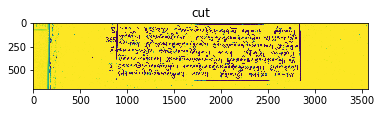

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00056-0.jpg !!!
[0, 968.3333333333334, 3562, 1758.6666666666667]


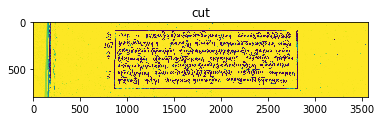

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00056-1.jpg !!!
[0, 1720.3333333333333, 3562, 2609.0]


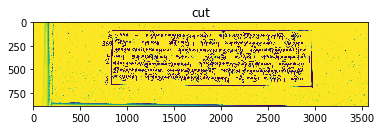

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00056-2.jpg !!!
image00057.jpg
(3409, 2576)
Processing image00057


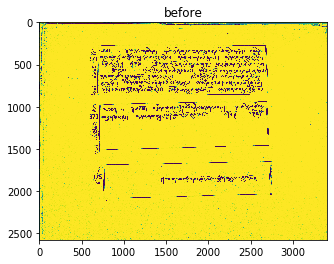

{1: 426, 3: 189, 2: 391, 4: 82}
threshold 2
[0, 261, 3409, 873]
[0, 932, 3409, 1384]
[0, 1640, 3409, 2091]
[0, 2435, 3409, 2564]
[0, 261, 3409, 912.3333333333334]


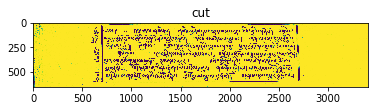

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00057-0.jpg !!!
[0, 892.6666666666666, 3409, 1423.3333333333333]


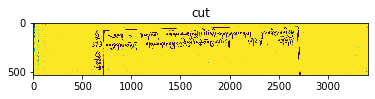

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00057-1.jpg !!!
[0, 1600.6666666666667, 3409, 2130.3333333333335]


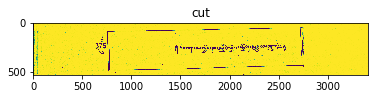

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00057-2.jpg !!!
[0, 2395.6666666666665, 3409, 2575.0]


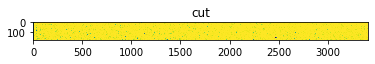

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00057-3.jpg !!!
image00058.jpg
(3414, 2572)
Processing image00058


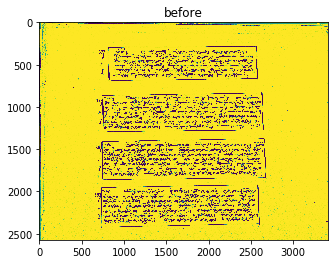

{1: 121, 2: 137, 4: 25, 3: 23}
threshold 2
[0, 278, 3414, 702]
[0, 828, 3414, 1305]
[0, 1368, 3414, 1870]
[0, 1911, 3414, 2431]
[0, 278, 3414, 753.1111111111111]


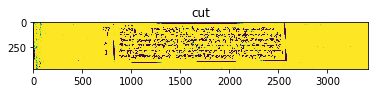

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00058-0.jpg !!!
[0, 776.8888888888889, 3414, 1356.111111111111]


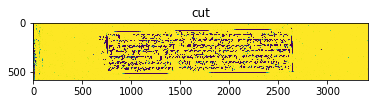

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00058-1.jpg !!!
[0, 1316.888888888889, 3414, 1921.111111111111]


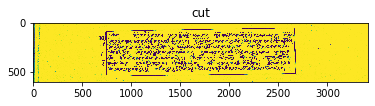

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00058-2.jpg !!!
[0, 1859.888888888889, 3414, 2482.1111111111113]


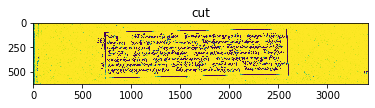

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00058-3.jpg !!!
image00059.jpg
(3602, 2563)
Processing image00059


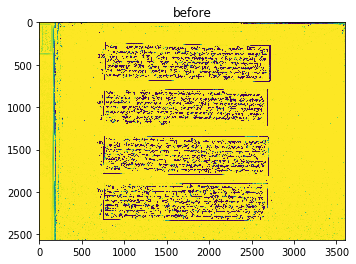

{3: 30, 1: 191, 2: 126, 4: 20}
threshold 2
[0, 238, 3602, 708]
[0, 777, 3602, 1236]
[0, 1331, 3602, 1811]
[0, 1882, 3602, 2349]
[0, 238, 3602, 760.2222222222222]


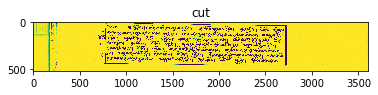

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00059-0.jpg !!!
[0, 724.7777777777778, 3602, 1288.2222222222222]


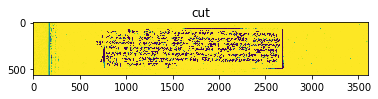

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00059-1.jpg !!!
[0, 1278.7777777777778, 3602, 1863.2222222222222]


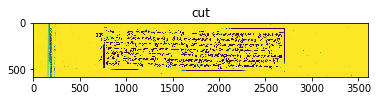

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00059-2.jpg !!!
[0, 1829.7777777777778, 3602, 2401.222222222222]


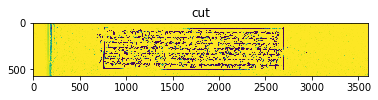

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00059-3.jpg !!!
image00060.jpg
(3411, 2578)
Processing image00060


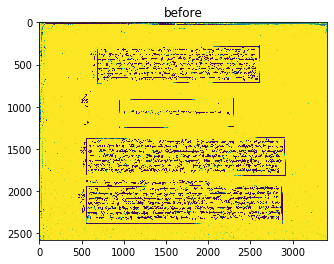

{3: 50, 1: 287, 4: 40, 2: 224}
threshold 2
[0, 279, 3411, 700]
[0, 1356, 3411, 1798]
[0, 1865, 3411, 2394]
[0, 279, 3411, 744.6666666666666]


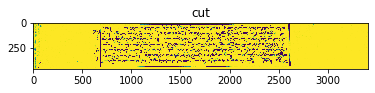

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-0.jpg !!!
[0, 1311.3333333333333, 3411, 1842.6666666666667]


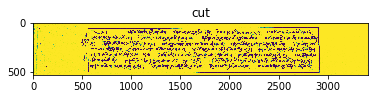

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-1.jpg !!!
[0, 1820.3333333333333, 3411, 2438.6666666666665]


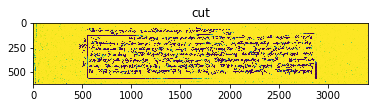

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-2.jpg !!!
image00061.jpg
(3485, 2560)
Processing image00061


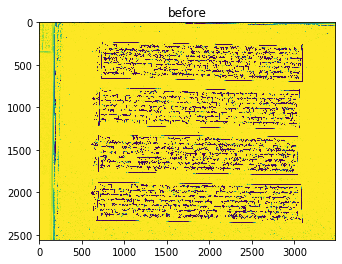

{2: 98, 4: 13, 3: 12, 1: 211}
threshold 2
[0, 227, 3485, 707]
[0, 767, 3485, 1266]
[0, 1317, 3485, 1803]
[0, 1873, 3485, 2373]
[0, 227, 3485, 747.2222222222222]


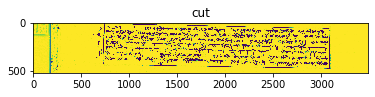

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00061-0.jpg !!!
[0, 726.7777777777778, 3485, 1306.2222222222222]


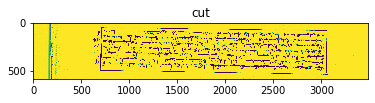

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00061-1.jpg !!!
[0, 1276.7777777777778, 3485, 1843.2222222222222]


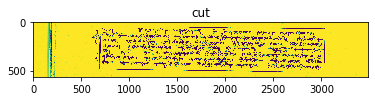

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00061-2.jpg !!!
[0, 1832.7777777777778, 3485, 2413.222222222222]


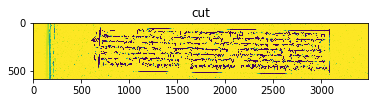

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00061-3.jpg !!!
image00062.jpg
(3541, 2594)
Processing image00062


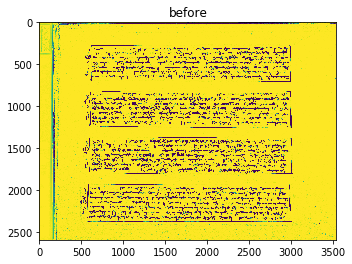

{3: 46, 4: 38, 2: 154, 1: 134}
threshold 2
[0, 261, 3541, 718]
[0, 810, 3541, 1269]
[0, 1359, 3541, 1819]
[0, 1920, 3541, 2389]
[0, 2451, 3541, 2582]
[0, 261, 3541, 775.5]


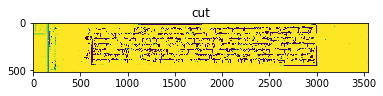

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00062-0.jpg !!!
[0, 752.5, 3541, 1326.5]


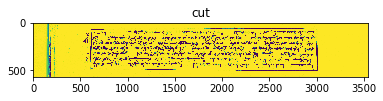

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00062-1.jpg !!!
[0, 1301.5, 3541, 1876.5]


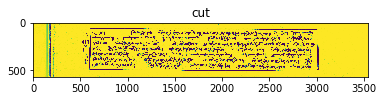

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00062-2.jpg !!!
[0, 1862.5, 3541, 2446.5]


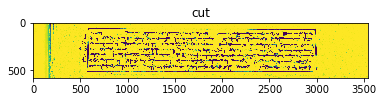

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00062-3.jpg !!!
[0, 2393.5, 3541, 2593.0]


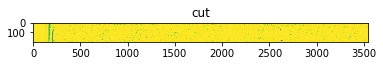

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00062-4.jpg !!!
image00063.jpg
(3589, 2587)
Processing image00063


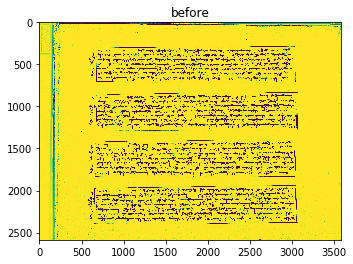

{4: 16, 1: 108, 2: 160, 3: 15}
threshold 2
[0, 281, 3589, 725]
[0, 827, 3589, 1296]
[0, 1388, 3589, 1852]
[0, 1931, 3589, 2408]
[0, 2450, 3589, 2575]
[0, 281, 3589, 777.5]


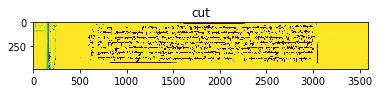

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00063-0.jpg !!!
[0, 774.5, 3589, 1348.5]


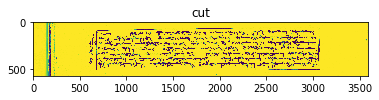

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00063-1.jpg !!!
[0, 1335.5, 3589, 1904.5]


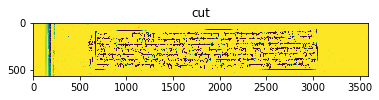

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00063-2.jpg !!!
[0, 1878.5, 3589, 2460.5]


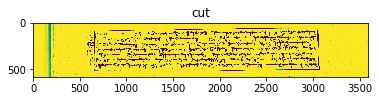

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00063-3.jpg !!!
[0, 2397.5, 3589, 2586.0]


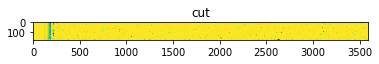

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00063-4.jpg !!!
image00064.jpg
(3591, 2575)
Processing image00064


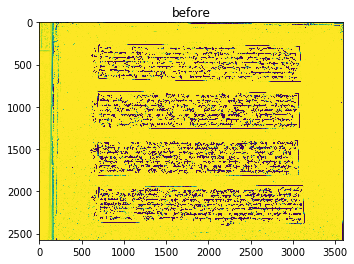

{2: 136, 1: 130, 4: 22, 3: 61}
threshold 2
[0, 250, 3591, 712]
[0, 810, 3591, 1269]
[0, 1381, 3591, 1829]
[0, 1921, 3591, 2563]
[0, 250, 3591, 779.1111111111111]


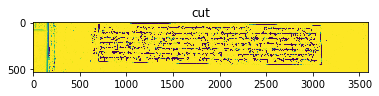

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00064-0.jpg !!!
[0, 742.8888888888889, 3591, 1336.111111111111]


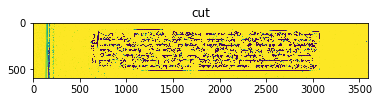

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00064-1.jpg !!!
[0, 1313.888888888889, 3591, 1896.111111111111]


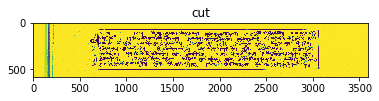

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00064-2.jpg !!!
[0, 1853.888888888889, 3591, 2574.0]


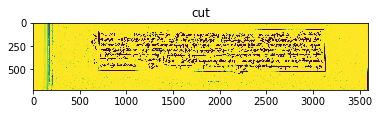

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00064-3.jpg !!!
image00065.jpg
(3584, 2599)
Processing image00065


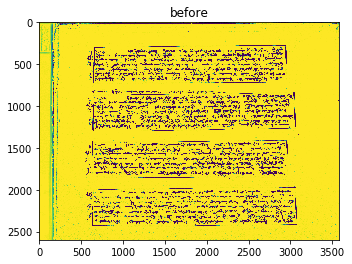

{4: 13, 2: 135, 1: 123, 3: 18}
threshold 2
[0, 269, 3584, 740]
[0, 807, 3584, 1311]
[0, 1404, 3584, 1863]
[0, 1965, 3584, 2445]
[0, 269, 3584, 798.2222222222222]


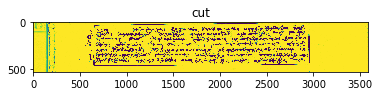

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00065-0.jpg !!!
[0, 748.7777777777778, 3584, 1369.2222222222222]


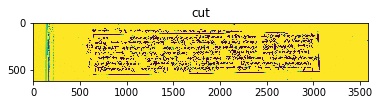

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00065-1.jpg !!!
[0, 1345.7777777777778, 3584, 1921.2222222222222]


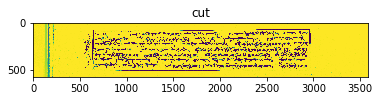

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00065-2.jpg !!!
[0, 1906.7777777777778, 3584, 2503.222222222222]


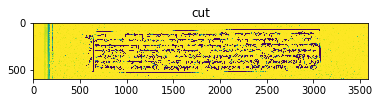

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00065-3.jpg !!!
image00066.jpg
(3402, 2605)
Processing image00066


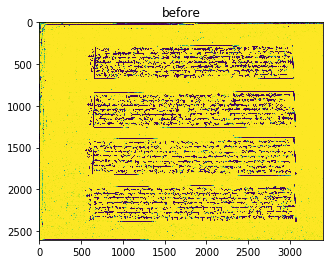

{3: 28, 1: 185, 2: 139, 4: 16}
threshold 2
[0, 266, 3402, 693]
[0, 820, 3402, 1274]
[0, 1369, 3402, 1844]
[0, 1936, 3402, 2401]
[0, 2467, 3402, 2593]
[0, 266, 3402, 756.3333333333334]


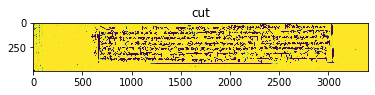

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00066-0.jpg !!!
[0, 756.6666666666666, 3402, 1337.3333333333333]


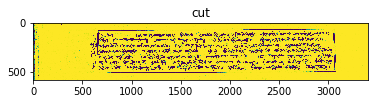

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00066-1.jpg !!!
[0, 1305.6666666666667, 3402, 1907.3333333333333]


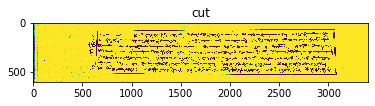

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00066-2.jpg !!!
[0, 1872.6666666666667, 3402, 2464.3333333333335]


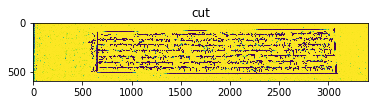

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00066-3.jpg !!!
[0, 2403.6666666666665, 3402, 2604.0]


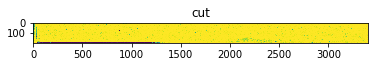

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00066-4.jpg !!!
image00067.jpg
(3579, 2587)
Processing image00067


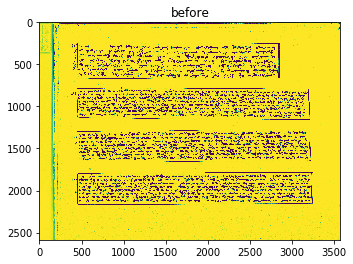

{4: 18, 3: 27, 2: 193, 1: 309}
threshold 2
[0, 239, 3579, 687]
[0, 774, 3579, 1169]
[0, 1270, 3579, 1672]
[0, 1773, 3579, 2177]
[0, 239, 3579, 751.2222222222222]


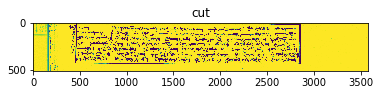

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00067-0.jpg !!!
[0, 709.7777777777778, 3579, 1233.2222222222222]


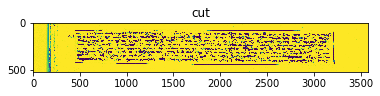

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00067-1.jpg !!!
[0, 1205.7777777777778, 3579, 1736.2222222222222]


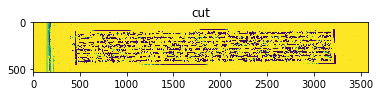

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00067-2.jpg !!!
[0, 1708.7777777777778, 3579, 2241.222222222222]


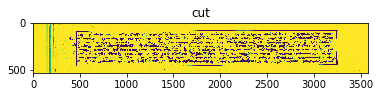

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00067-3.jpg !!!
image00068.jpg
(3402, 2583)
Processing image00068


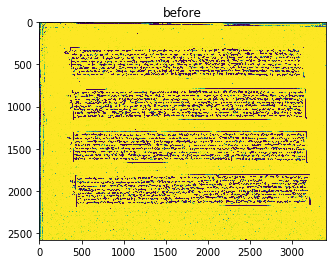

{3: 79, 1: 227, 2: 260, 4: 29}
threshold 2
[0, 284, 3402, 647]
[0, 775, 3402, 1170]
[0, 1288, 3402, 1681]
[0, 1795, 3402, 2195]
[0, 2323, 3402, 2571]
[0, 284, 3402, 728.3333333333334]


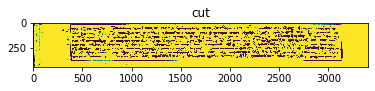

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00068-0.jpg !!!
[0, 693.6666666666666, 3402, 1251.3333333333333]


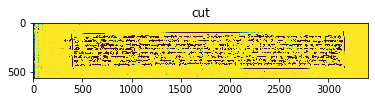

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00068-1.jpg !!!
[0, 1206.6666666666667, 3402, 1762.3333333333333]


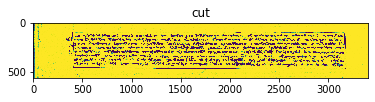

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00068-2.jpg !!!
[0, 1713.6666666666667, 3402, 2276.3333333333335]


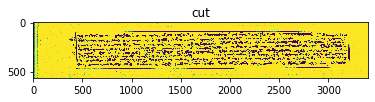

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00068-3.jpg !!!
[0, 2241.6666666666665, 3402, 2582.0]


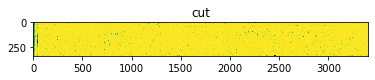

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00068-4.jpg !!!
image00069.jpg
(3570, 2597)
Processing image00069


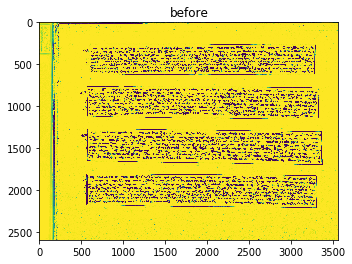

{4: 11, 2: 182, 1: 282, 3: 9}
threshold 2
[0, 252, 3570, 640]
[0, 759, 3570, 1167]
[0, 1264, 3570, 1707]
[0, 1801, 3570, 2222]
[0, 2452, 3570, 2585]
[0, 252, 3570, 708.8888888888889]


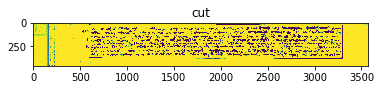

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00069-0.jpg !!!
[0, 690.1111111111111, 3570, 1235.888888888889]


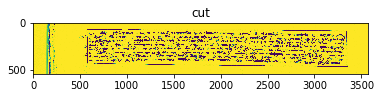

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00069-1.jpg !!!
[0, 1195.111111111111, 3570, 1775.888888888889]


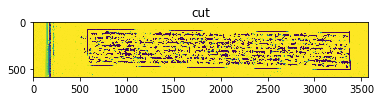

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00069-2.jpg !!!
[0, 1732.111111111111, 3570, 2290.8888888888887]


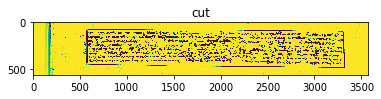

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00069-3.jpg !!!
[0, 2383.1111111111113, 3570, 2596.0]


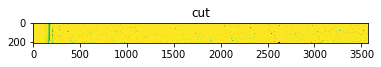

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00069-4.jpg !!!
image00070.jpg
(3496, 2590)
Processing image00070


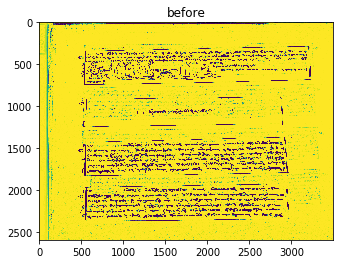

{3: 118, 1: 161, 2: 281, 4: 76}
threshold 2
[0, 249, 3496, 788]
[0, 799, 3496, 1253]
[0, 1304, 3496, 2375]
[0, 2394, 3496, 2578]
[0, 249, 3496, 806.0]


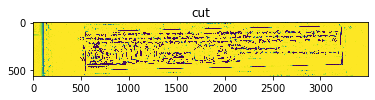

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-0.jpg !!!
[0, 781.0, 3496, 1271.0]


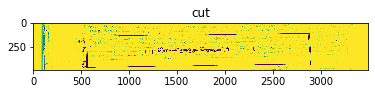

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-1.jpg !!!
[0, 1286.0, 3496, 2393.0]


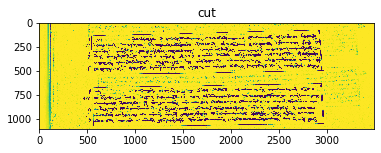

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-2.jpg !!!
[0, 2376.0, 3496, 2589.0]


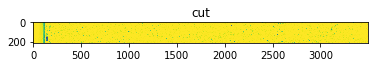

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-3.jpg !!!
image00071.jpg
(3383, 2591)
Processing image00071


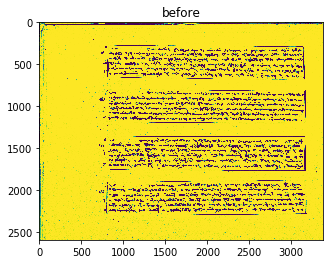

{4: 15, 3: 43, 2: 236, 1: 190}
threshold 2
[0, 268, 3383, 692]
[0, 797, 3383, 1211]
[0, 1349, 3383, 1777]
[0, 1869, 3383, 2304]
[0, 268, 3383, 766.4444444444445]


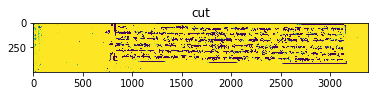

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00071-0.jpg !!!
[0, 722.5555555555555, 3383, 1285.4444444444443]


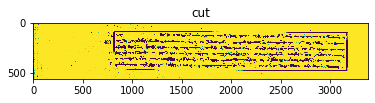

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00071-1.jpg !!!
[0, 1274.5555555555557, 3383, 1851.4444444444443]


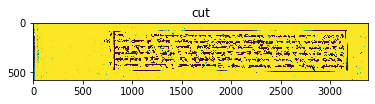

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00071-2.jpg !!!
[0, 1794.5555555555557, 3383, 2378.4444444444443]


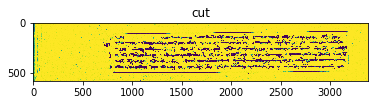

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00071-3.jpg !!!
image00072.jpg
(3504, 2578)
Processing image00072


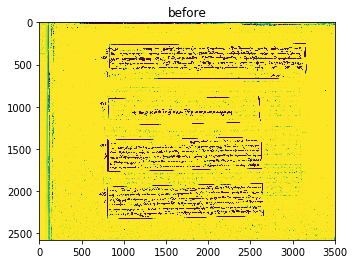

{2: 298, 1: 189, 3: 129, 4: 83}
threshold 2
[0, 246, 3504, 681]
[0, 869, 3504, 1126]
[0, 1332, 3504, 1807]
[0, 1874, 3504, 2341]
[0, 2349, 3504, 2566]
[0, 246, 3504, 706.0]


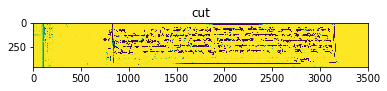

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00072-0.jpg !!!
[0, 844.0, 3504, 1151.0]


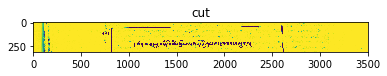

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00072-1.jpg !!!
[0, 1307.0, 3504, 1832.0]


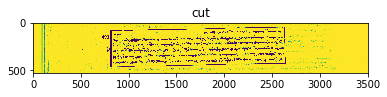

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00072-2.jpg !!!
[0, 1849.0, 3504, 2366.0]


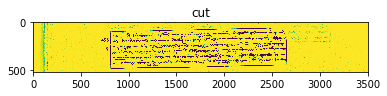

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00072-3.jpg !!!
[0, 2324.0, 3504, 2577.0]


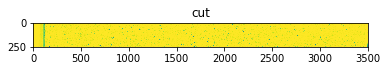

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00072-4.jpg !!!
image00073.jpg
(3556, 2595)
Processing image00073


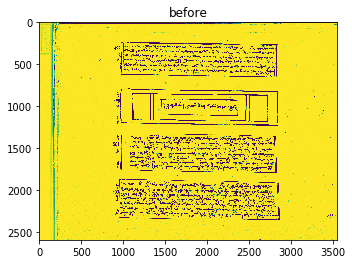

{3: 27, 4: 11, 1: 201, 2: 126}
threshold 2
[0, 232, 3556, 663]
[0, 785, 3556, 1244]
[0, 1321, 3556, 1801]
[0, 1863, 3556, 2364]
[0, 232, 3556, 721.0]


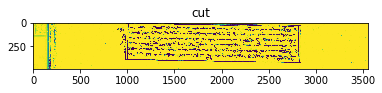

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00073-0.jpg !!!
[0, 727.0, 3556, 1302.0]


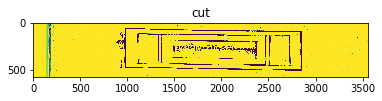

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00073-1.jpg !!!
[0, 1263.0, 3556, 1859.0]


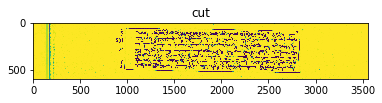

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00073-2.jpg !!!
[0, 1805.0, 3556, 2422.0]


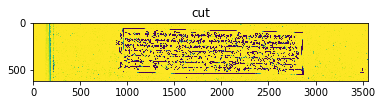

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00073-3.jpg !!!
image00074.jpg
(3556, 2593)
Processing image00074


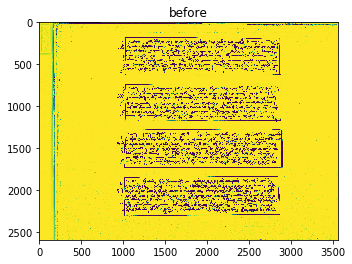

{4: 30, 3: 33, 2: 170, 1: 258}
threshold 2
[0, 173, 3556, 609]
[0, 724, 3556, 1182]
[0, 1295, 3556, 1743]
[0, 1826, 3556, 2316]
[0, 173, 3556, 678.1111111111111]


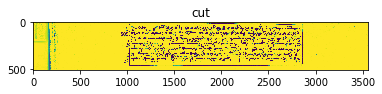

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00074-0.jpg !!!
[0, 654.8888888888889, 3556, 1251.111111111111]


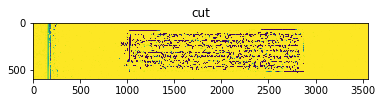

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00074-1.jpg !!!
[0, 1225.888888888889, 3556, 1812.111111111111]


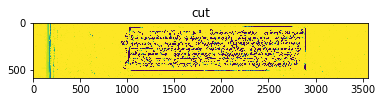

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00074-2.jpg !!!
[0, 1756.888888888889, 3556, 2385.1111111111113]


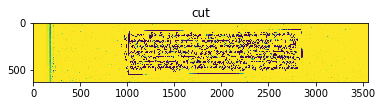

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00074-3.jpg !!!
image00075.jpg
(3380, 2593)
Processing image00075


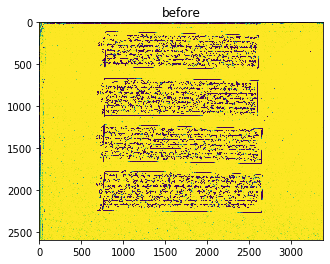

{4: 16, 2: 227, 3: 87, 1: 143}
threshold 2
[0, 103, 3380, 570]
[0, 663, 3380, 1130]
[0, 1214, 3380, 1695]
[0, 1764, 3380, 2277]
[0, 2288, 3380, 2581]
[0, 103, 3380, 612.8333333333334]


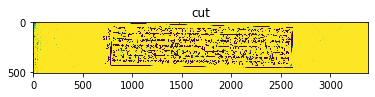

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00075-0.jpg !!!
[0, 620.1666666666666, 3380, 1172.8333333333333]


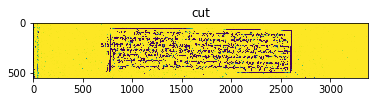

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00075-1.jpg !!!
[0, 1171.1666666666667, 3380, 1737.8333333333333]


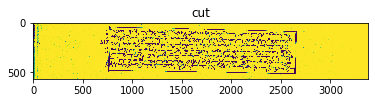

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00075-2.jpg !!!
[0, 1721.1666666666667, 3380, 2319.8333333333335]


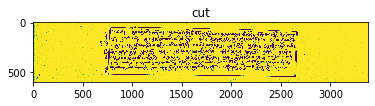

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00075-3.jpg !!!
[0, 2245.1666666666665, 3380, 2592.0]


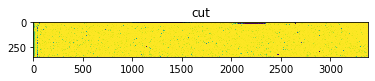

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00075-4.jpg !!!
image00076.jpg
(3393, 2593)
Processing image00076


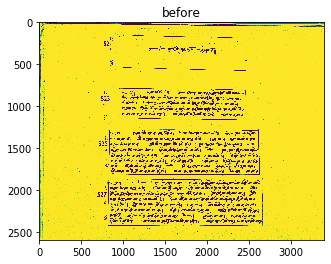

{3: 87, 1: 184, 4: 89, 2: 189}
threshold 2
[0, 146, 3393, 390]
[0, 779, 3393, 1172]
[0, 1270, 3393, 1826]
[0, 1857, 3393, 2437]
[0, 133.0, 3393, 433.0]


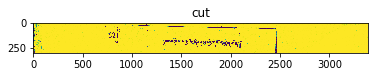

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00076-0.jpg !!!
[0, 736.0, 3393, 1215.0]


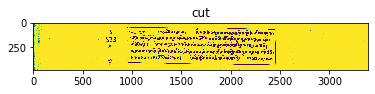

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00076-1.jpg !!!
[0, 1227.0, 3393, 1869.0]


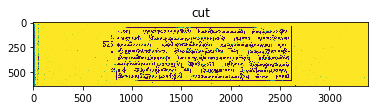

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00076-2.jpg !!!
[0, 1814.0, 3393, 2480.0]


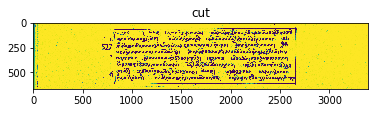

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00076-3.jpg !!!
image00077.jpg
(3388, 2593)
Processing image00077


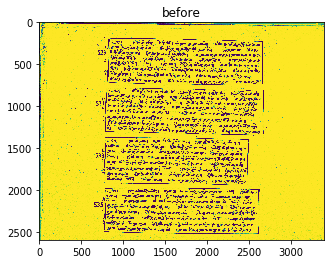

{4: 10, 2: 67, 1: 98, 3: 17}
threshold 2
[0, 185, 3388, 759]
[0, 777, 3388, 1352]
[0, 1364, 3388, 1948]
[0, 1963, 3388, 2530]
[0, 185, 3388, 769.0]


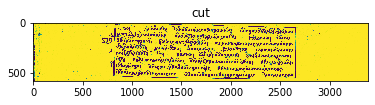

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00077-0.jpg !!!
[0, 767.0, 3388, 1362.0]


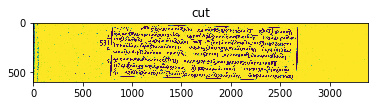

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00077-1.jpg !!!
[0, 1354.0, 3388, 1958.0]


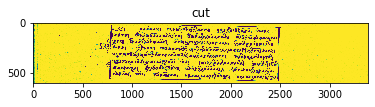

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00077-2.jpg !!!
[0, 1953.0, 3388, 2540.0]


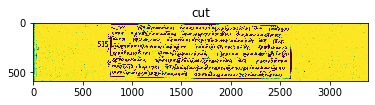

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00077-3.jpg !!!
image00078.jpg
(3393, 2595)
Processing image00078


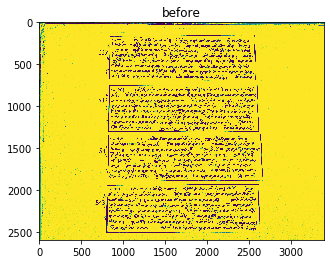

{4: 32, 1: 73, 2: 81, 3: 50}
threshold 2
[0, 146, 3393, 705]
[0, 739, 3393, 1314]
[0, 1335, 3393, 1903]
[0, 1921, 3393, 2522]
[0, 146, 3393, 721.2222222222222]


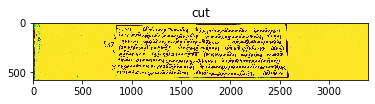

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00078-0.jpg !!!
[0, 722.7777777777778, 3393, 1330.2222222222222]


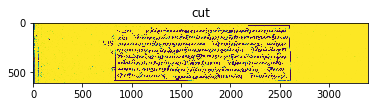

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00078-1.jpg !!!
[0, 1318.7777777777778, 3393, 1919.2222222222222]


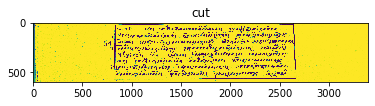

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00078-2.jpg !!!
[0, 1904.7777777777778, 3393, 2538.222222222222]


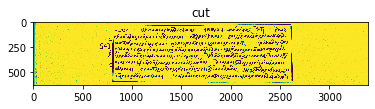

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00078-3.jpg !!!
image00079.jpg
(3551, 2586)
Processing image00079


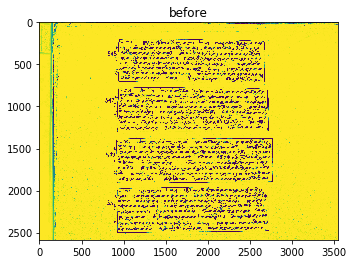

{4: 19, 1: 64, 2: 65, 3: 27}
threshold 2
[0, 193, 3551, 722]
[0, 767, 3551, 1307]
[0, 1368, 3551, 1918]
[0, 1945, 3551, 2510]
[0, 193, 3551, 751.5555555555555]


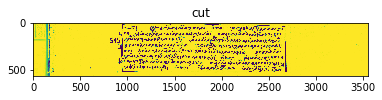

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00079-0.jpg !!!
[0, 737.4444444444445, 3551, 1336.5555555555557]


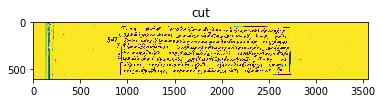

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00079-1.jpg !!!
[0, 1338.4444444444443, 3551, 1947.5555555555557]


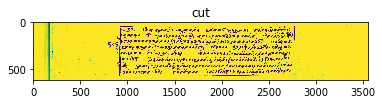

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00079-2.jpg !!!
[0, 1915.4444444444443, 3551, 2539.5555555555557]


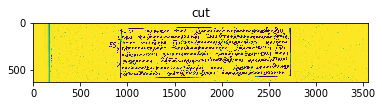

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00079-3.jpg !!!
image00080.jpg
(3494, 2596)
Processing image00080


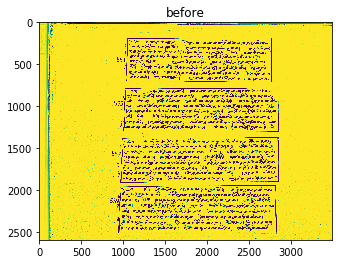

{3: 66, 1: 99, 2: 47, 4: 25}
threshold 2
[0, 186, 3494, 725]
[0, 774, 3494, 1312]
[0, 1365, 3494, 1922]
[0, 1935, 3494, 2527]
[0, 186, 3494, 750.5555555555555]


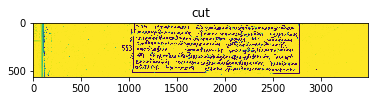

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00080-0.jpg !!!
[0, 748.4444444444445, 3494, 1337.5555555555557]


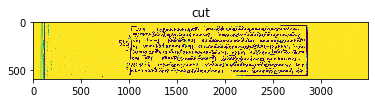

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00080-1.jpg !!!
[0, 1339.4444444444443, 3494, 1947.5555555555557]


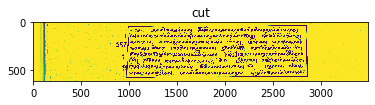

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00080-2.jpg !!!
[0, 1909.4444444444443, 3494, 2552.5555555555557]


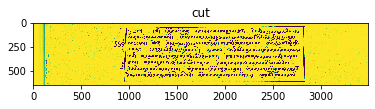

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00080-3.jpg !!!
image00081.jpg
(3367, 2597)
Processing image00081


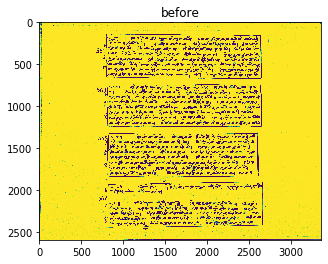

{1: 93, 2: 91, 4: 23, 3: 39}
threshold 2
[0, 135, 3367, 685]
[0, 726, 3367, 1257]
[0, 1312, 3367, 1855]
[0, 1897, 3367, 2476]
[0, 135, 3367, 715.6666666666666]


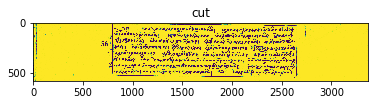

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00081-0.jpg !!!
[0, 695.3333333333334, 3367, 1287.6666666666667]


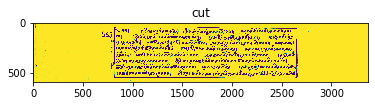

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00081-1.jpg !!!
[0, 1281.3333333333333, 3367, 1885.6666666666667]


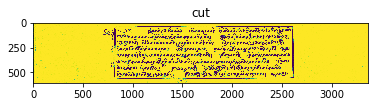

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00081-2.jpg !!!
[0, 1866.3333333333333, 3367, 2506.6666666666665]


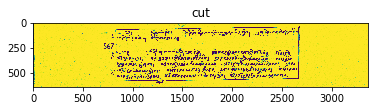

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00081-3.jpg !!!
image00082.jpg
(3378, 2603)
Processing image00082


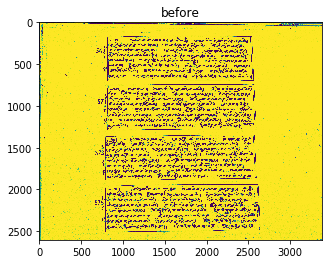

{2: 71, 1: 107, 3: 45, 4: 21}
threshold 2
[0, 159, 3378, 707]
[0, 736, 3378, 1299]
[0, 1340, 3378, 1897]
[0, 1929, 3378, 2591]
[0, 159, 3378, 729.6666666666666]


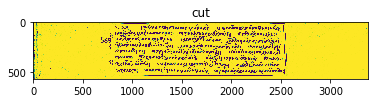

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00082-0.jpg !!!
[0, 713.3333333333334, 3378, 1321.6666666666667]


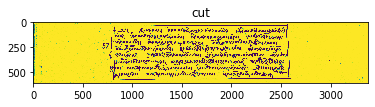

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00082-1.jpg !!!
[0, 1317.3333333333333, 3378, 1919.6666666666667]


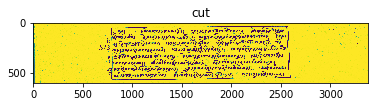

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00082-2.jpg !!!
[0, 1906.3333333333333, 3378, 2602.0]


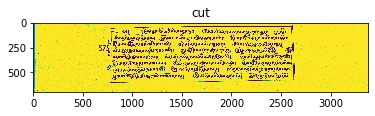

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00082-3.jpg !!!
image00083.jpg
(3473, 2603)
Processing image00083


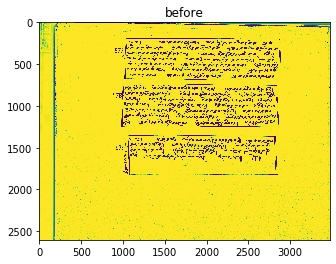

{4: 56, 3: 211, 2: 338, 1: 400}
threshold 2
[0, 187, 3473, 702]
[0, 729, 3473, 1262]
[0, 1343, 3473, 1834]
[0, 2279, 3473, 2591]
[0, 187, 3473, 738.0]


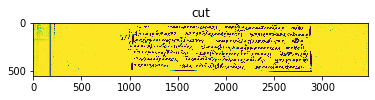

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00083-0.jpg !!!
[0, 693.0, 3473, 1298.0]


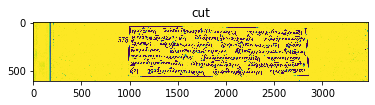

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00083-1.jpg !!!
[0, 1307.0, 3473, 1870.0]


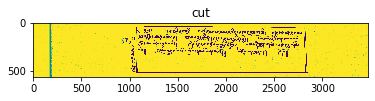

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00083-2.jpg !!!
[0, 2243.0, 3473, 2602.0]


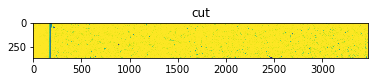

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00083-3.jpg !!!


In [0]:
# for all images in the image list, call crop()
for image_name in image_list:
  print(image_name)
  im = Image.open(image_name)
  print(im.size)
  crop(im, image_name[:-4], threshold)

In [0]:
print(failed_list)

['image00001']


image00001.jpg
(3479, 2523)
Processing image00001


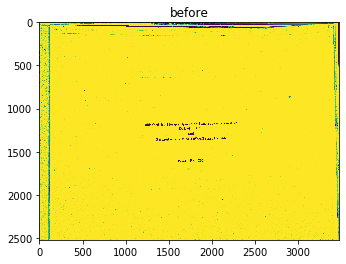

{4: 23, 3: 28, 2: 59, 1: 343}
threshold 1
[0, 20, 3479, 178]
[0, 2242, 3479, 2501]
[0, 0, 3479, 244.66666666666669]


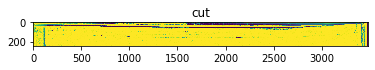

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00001-0.jpg !!!
[0, 2175.3333333333335, 3479, 2522.0]


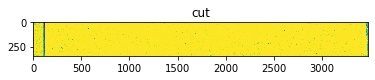

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00001-1.jpg !!!
image00001 Failed
image00002.jpg
(3410, 2573)
Processing image00002


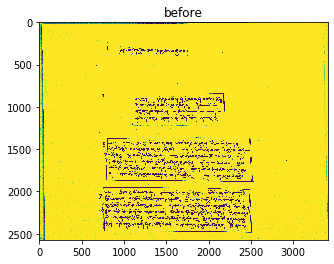

{4: 38, 1: 126, 2: 53, 3: 53}
threshold 1
[0, 276, 3410, 406]
[0, 818, 3410, 1240]
[0, 1345, 3410, 1905]
[0, 1932, 3410, 2551]
[0, 150.0, 3410, 450.0]


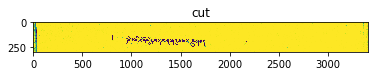

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-0.jpg !!!
[0, 774.0, 3410, 1284.0]


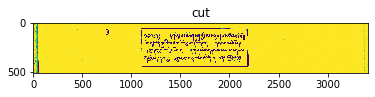

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-1.jpg !!!
[0, 1301.0, 3410, 1949.0]


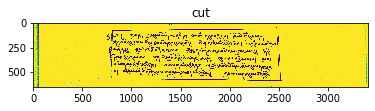

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-2.jpg !!!
[0, 1888.0, 3410, 2572.0]


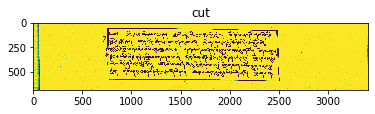

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00002-3.jpg !!!
image00042.jpg
(3384, 2564)
Processing image00042


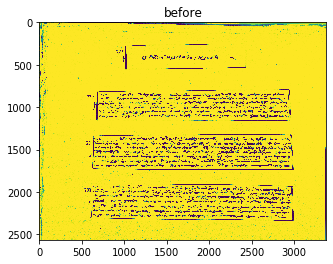

{1: 284, 2: 231, 4: 42, 3: 103}
threshold 1
[0, 20, 3384, 152]
[0, 237, 3384, 572]
[0, 776, 3384, 1178]
[0, 1302, 3384, 1880]
[0, 1883, 3384, 2542]
[0, 0, 3384, 199.11111111111111]


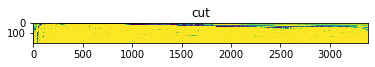

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-0.jpg !!!
[0, 189.88888888888889, 3384, 619.1111111111111]


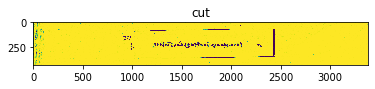

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-1.jpg !!!
[0, 728.8888888888889, 3384, 1225.111111111111]


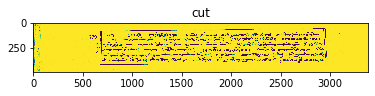

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-2.jpg !!!
[0, 1254.888888888889, 3384, 1927.111111111111]


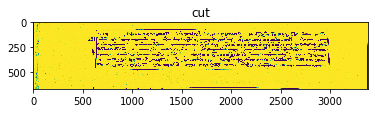

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-3.jpg !!!
[0, 1835.888888888889, 3384, 2563.0]


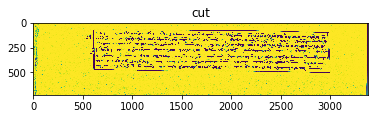

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00042-4.jpg !!!
image00052.jpg
(3403, 2564)
Processing image00052


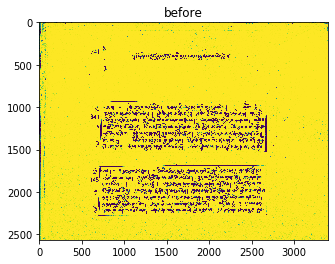

{3: 82, 2: 194, 1: 247, 4: 21}
threshold 1
[0, 284, 3403, 465]
[0, 906, 3403, 1553]
[0, 1665, 3403, 2542]
[0, 239.66666666666663, 3403, 539.6666666666666]


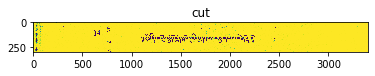

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-0.jpg !!!
[0, 831.3333333333334, 3403, 1627.6666666666667]


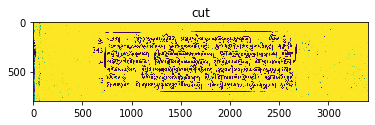

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-1.jpg !!!
[0, 1590.3333333333333, 3403, 2563.0]


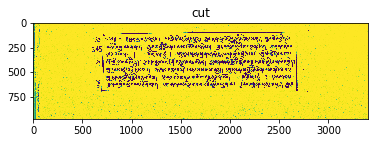

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00052-2.jpg !!!
image00060.jpg
(3411, 2578)
Processing image00060


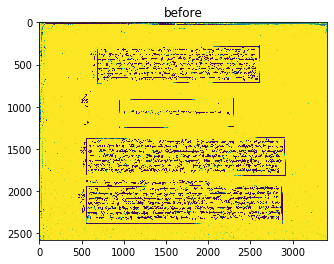

{3: 50, 1: 287, 4: 40, 2: 224}
threshold 1
[0, 268, 3411, 744]
[0, 867, 3411, 1270]
[0, 1346, 3411, 1844]
[0, 1854, 3411, 2556]
[0, 268, 3411, 790.4444444444445]


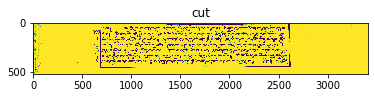

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-0.jpg !!!
[0, 820.5555555555555, 3411, 1316.4444444444443]


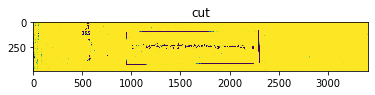

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-1.jpg !!!
[0, 1299.5555555555557, 3411, 1890.4444444444443]


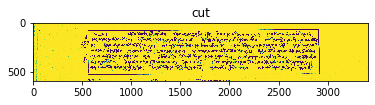

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-2.jpg !!!
[0, 1807.5555555555557, 3411, 2577.0]


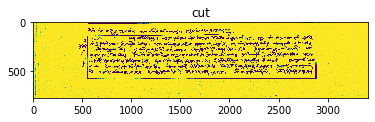

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00060-3.jpg !!!
image00070.jpg
(3496, 2590)
Processing image00070


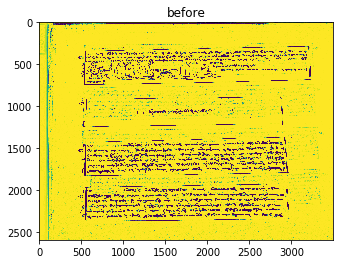

{3: 118, 1: 161, 2: 281, 4: 76}
threshold 1
[0, 237, 3496, 2568]
[0, 237, 3496, 2568]


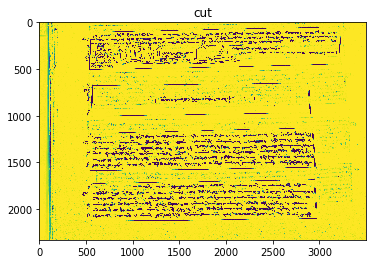

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-0.jpg !!!
image00070 Failed
image00001


FileNotFoundError: ignored

In [0]:
threshold = 1
rows = 20
failed_list = ["image00001.jpg", "image00002.jpg", "image00042.jpg", "image00052.jpg", "image00060.jpg", "image00070.jpg"]
# failed_list = ["image00002.jpg"]
for image_name in failed_list:
  print(image_name)
  im = Image.open(image_name)
  print(im.size)
  crop(im, image_name[:-4], threshold)

image00001.jpg
(3479, 2523)
Processing image00001


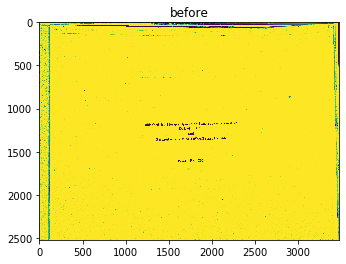

{4: 23, 3: 28, 2: 59, 1: 343}
threshold 2
image00001 Failed
image00070.jpg
(3496, 2590)
Processing image00070


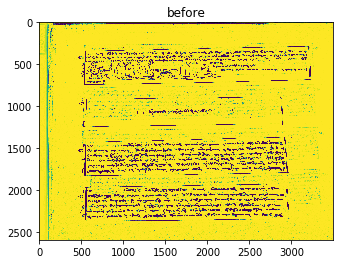

{3: 118, 1: 161, 2: 281, 4: 76}
threshold 2
[0, 286, 3496, 751]
[0, 887, 3496, 1168]
[0, 1361, 3496, 1829]
[0, 1832, 3496, 2367]
[0, 2448, 3496, 2587]
[0, 286, 3496, 799.8888888888889]


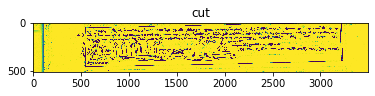

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-0.jpg !!!
[0, 838.1111111111111, 3496, 1216.888888888889]


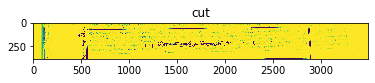

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-1.jpg !!!
[0, 1312.111111111111, 3496, 1877.888888888889]


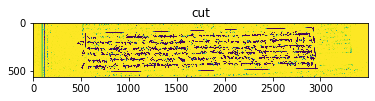

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-2.jpg !!!
[0, 1783.111111111111, 3496, 2415.8888888888887]


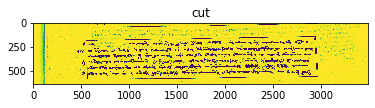

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-3.jpg !!!
[0, 2399.1111111111113, 3496, 2589.0]


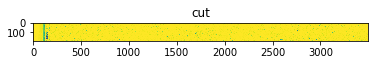

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/left_side/image00070-4.jpg !!!
image00001


FileNotFoundError: ignored

In [0]:
threshold = 2
rows = 1
failed_list = ["image00001.jpg", "image00070.jpg"]
# failed_list = ["image00002.jpg"]
for image_name in failed_list:
  print(image_name)
  im = Image.open(image_name)
  print(im.size)
  crop(im, image_name[:-4], threshold)